In [1]:
import os 
# going to root directory (if not there yet)
current_dir = os.getcwd().split('/')[-1]
if current_dir != 'pixelNMF': 
    os.chdir('..')
    os.chdir('..') # fix 

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns 
import pandas as pd
from collections import defaultdict

import numpy as np
import matplotlib.pyplot as plt 
import random
from skimage.io import imsave as imwrite
from scipy.ndimage import center_of_mass
from scipy.signal import find_peaks
from scipy import stats
import statsmodels.stats.multitest as smm  # import the module
from scipy.stats import spearmanr
from scipy.signal import detrend 
from scipy.ndimage import gaussian_filter1d
from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn.neighbors import NearestNeighbors
from scipy.signal import savgol_filter

# !pip install umap-learn

from umap import UMAP
from tifffile import imwrite, imread
from pathlib import Path

# import matplotlib.pyplot as plt
from sklearn.decomposition import NMF
from openTSNE import TSNE
from rastermap import Rastermap, utils 
from scipy.spatial.distance import pdist, squareform

# predictions
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score

# custom libraries 
from patchnmf.preprocessing import *
from patchnmf.data_io import *
from patchnmf.analyse.compute import *
from patchnmf.plot import *

# setting common plot params 
from matplotlib import rcParams

rcParams['figure.figsize'] = [20, 4]
rcParams['font.size'] = 15
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['figure.autolayout'] = True

C:\Users\zaggila\Anaconda3\envs\pixelNMF\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Load everything

In [2]:
#example path: 
# FOR LOADING mousecraft outputs:
# data_proc/
#    cells/ or pixels/
#       sz089/
#          2024_06_06_a/ 
#              mousecraft/
#                  'validation_MF_final'.xls or 'mousecraft_validated_labels_HF_final.xls' (becs GUI outputs this name -- maximeeeee)

# FOR LOADING motion energy:
# data_proc/
#    cells/ or pixels/
#       sz089/
#          2024_06_06_a/ 
#              camera_processed/
#                    motion_energy.npy

# FOR LOADING SLEAP outputs:
# data_proc/
#    cells/ or pixels/
#       sz089/
#          2024_06_06_a/ 
#              sleap_output/
#                    sleap_output.csv or sleap_output.h5

# FOR LOADING excel_params:

# data_proc/
#    pixelnmf_params.xlsx

In [3]:
def build_groups_from_excel(excel_path):
    
    # load metadata
    df = pd.read_excel(excel_path)

    # Ensure lowercase consistency (optional)
    df['genotype'] = df['genotype'].str.upper()

    # Dictionaries to store groups
    genotype_age_groups = defaultdict(list)
    age_only_groups = defaultdict(list)

    # Iterate and populate
    for _, row in df.iterrows():
        dataset_id = row['ds']
        age = row['age']
        genotype = row['genotype']

        # group by genotype + age (e.g., GABA_p2)
        genotype_age_groups[f"{genotype}_{age}"].append(dataset_id)

        # group by age (emx-gad) (e.g., all_p2)
        age_only_groups[f"all_{age}"].append(dataset_id)

    return dict(genotype_age_groups), dict(age_only_groups)

# TODO: merge with dual imaging params xls -- to include analysis and mousecraft outputs from all ages 

In [4]:
pixelnmf_params = r'C:/Users/zaggila/Documents/pixelNMF/data_proc/pixelnmf_params.xlsx' # metadata xls 
data_root = r'C:\Users\zaggila\Documents\pixelNMF\data_proc'

# Make age and genotype groups based on pixelnmf_params (metadata file)

In [5]:
genotype_age_groups, age_groups = build_groups_from_excel(pixelnmf_params)

print(genotype_age_groups.keys())  # loads all dict_keys as genotype_age eg GAD_p1 or EMX_P3 and so on
print(age_groups.keys())  # loads all dict_keys as emx-gad_p1 so groups by age and genotype        

dict_keys(['EMX_p6', 'EMX_p5', 'EMX_p4', 'EMX_p3', 'EMX_0', 'GAD_p1', 'GAD_p2', 'GAD_p3', 'GAD_p4', 'GAD_p5', 'GAD_p6', 'GAD_p7', 'GAD_0', 'GAD_p8', 'GAD_p9', 'GAD_p10', 'EMX_p2', 'EMX_p1'])
dict_keys(['all_p6', 'all_p5', 'all_p4', 'all_p3', 'all_0', 'all_p1', 'all_p2', 'all_p7', 'all_p8', 'all_p9', 'all_p10'])


In [6]:
# print(genotype_age_groups['EMX_p3'])

# Load mousecraft outputs 

Requires updated metadata and mousecraft column == 1 for datasets we have validated using Mousecraft

## Calculate various behavioral metrices of interest and plot how they evolve along days (age groups) as well as per gentoype (age + genotype groups)

In [7]:
# may induce naming issue from difference with '-' or '_' try f() under
def read_params(pixelnmf_params, ds):

    # Load Excel file containing parameters
    df_params = pd.read_excel(pixelnmf_params)
    
    # define dataset 
    pd.options.display.float_format = '{:.3f}'.format
    
    params = df_params[df_params['ds'] == ds].iloc[0]
    
    # Assign parameters to variables
    genotype = params['genotype']
    blur_std = params['blur_std']
    downs_fact = params['downs_fact']
    res_orig = params['res_orig']
    x_axis = params['x_axis']
    y_axis = params['y_axis']
    original_FOV = params['original_FOV']
    framerate = params['framerate'] # (Hz)
    duration = params['duration'] #(s)
    n_components_elbow = params['n_components_elbow'] #cv_nmf output
    n_components_min = params['n_components_min'] #cv_nmf output
    age = params['age']
    weight_g = params['weight_g']
    s2p = params['s2p']
    cells = params['cells']
    Behaviour = params['Behaviour']
    mousecraft = params['mousecraft']
    SLEAP = params['SLEAP']
    
    # Calculate dependent parameters
    resolution = original_FOV / x_axis
    time_per_frame = 1 / framerate
    
    # Print table of parameters
    params_table = pd.DataFrame({
        'Parameter': ['genotype', 'blur_std', 'downs_fact', 'res_orig', 'x_axis', 'y_axis', 'original_FOV', 'framerate', 'duration', 'resolution', 'time_per_frame', 'n_components_elbow', 'n_components_min', 'age', 'weight_g', 's2p', 'cells', 'Behaviour', 'mousecraft', 'SLEAP'],
        'Value': [genotype, blur_std, downs_fact, res_orig, x_axis, y_axis, original_FOV, framerate, duration, resolution, time_per_frame, n_components_elbow, n_components_min, age, weight_g, s2p, cells, Behaviour, mousecraft, SLEAP]
    })
    
    styled_params_table = params_table.style.pipe(style_table).set_properties(**{'text-align': 'center'})

    # Display the styled table
    display(styled_params_table)
    
    return params_table, genotype, blur_std, downs_fact, res_orig, x_axis, y_axis,  original_FOV, framerate, duration, resolution, time_per_frame, n_components_elbow, n_components_min, age, weight_g, s2p, cells, Behaviour, mousecraft, SLEAP

In [8]:
# add me 
def load_s2p(session_path):
    iscell = np.load(os.path.join(session_path, "suite2p/plane0/iscell.npy"))[:,0].astype(bool) #iscell.shape is (2203,)
    fluo = np.load(os.path.join(session_path, "suite2p/plane0/F.npy")) #fluo.shape is (1925, 36000)
    
    # handling zeros rows in fluo (also need to modify iscell)
    nan_rows = np.unique(np.where(fluo == 0)[0]) # indices of rows (ROIs) that include zeros
    print(f'Found {len(nan_rows)} (/{len(iscell)}) ROIs including zeros')
    iscell[nan_rows] = False # new iscell with removed NaN rows
    
    fluo = fluo[iscell] # reindexing with removed NaN rows
    fluo.min()
    spks = np.load(os.path.join(session_path, "suite2p/plane0/spks.npy"))[iscell] #taking the spks of only the chosen iscell
    stat = np.load(os.path.join(session_path, "suite2p/plane0/stat.npy"), allow_pickle=True)[iscell] #same for stats, len(stat) = iscell good rois 
    ops = np.load(os.path.join(session_path, "suite2p/plane0/ops.npy"), allow_pickle=True).item()
    xpix = [stat[i]["xpix"] for i in range(stat.shape[0])] #contains iscell lists that contain the pixels that contour the ROI (to check eg the number of pixels of ROI 100 you can: len(xpix[100]))
    ypix = [stat[i]["ypix"] for i in range(stat.shape[0])]
    nframes = fluo.shape[1]
    avg_im = ops["meanImg"]
    max_proj = ops['max_proj']
    
    framerate= ops['fs']
    
    tstamps = np.arange(0, nframes/framerate, 1/framerate)
    n_neurons = spks.shape[0] #add to dictionary
       
    # colors = ['y', 'g', 'r', 'c', 'm', 'royalblue', 'orange']
    
    print(f'Found {sum(iscell)} (/{len(iscell)}) iscell ROIs')
    print(f'Shape: {fluo.shape}')

    return fluo, spks, stat, xpix, ypix, nframes, avg_im, max_proj, framerate, tstamps, n_neurons, max_proj 


def read_params(pixelnmf_params, ds):

    # Load Excel file containing parameters
    df_params = pd.read_excel(pixelnmf_params)
    
    # define dataset 
    pd.options.display.float_format = '{:.3f}'.format
    
    ds_norm = ds.replace('/', '_').replace('\\', '_').strip()

    df_params['ds'] = df_params['ds'].astype(str).str.strip()
    params = df_params[df_params['ds'] == ds_norm]

    
    if params.empty:
        raise ValueError(f"No matching parameters found for dataset: {ds}")
    
    # Assign parameters as scalars
    genotype = params['genotype'].iloc[0]
    blur_std = params['blur_std'].iloc[0]
    downs_fact = params['downs_fact'].iloc[0]
    res_orig = params['res_orig'].iloc[0]
    x_axis = params['x_axis'].iloc[0]
    y_axis = params['y_axis'].iloc[0]
    original_FOV = params['original_FOV'].iloc[0]
    framerate = params['framerate'].iloc[0]
    duration = params['duration'].iloc[0]
    n_components_elbow = params['n_components_elbow'].iloc[0]
    n_components_min = params['n_components_min'].iloc[0]
    age = params['age'].iloc[0]
    weight_g = params['weight_g'].iloc[0]
    s2p = params['s2p'].iloc[0]
    cells = params['cells'].iloc[0]
    Behaviour = params['Behaviour'].iloc[0]
    mousecraft = params['mousecraft'].iloc[0]
    SLEAP = params['SLEAP'].iloc[0]

    
    # Calculate dependent parameters
    resolution = original_FOV / x_axis
    time_per_frame = 1 / framerate
    
    # Print table of parameters
    params_table = pd.DataFrame({
        'Parameter': ['genotype', 'blur_std', 'downs_fact', 'res_orig', 'x_axis', 'y_axis', 'original_FOV', 'framerate', 'duration', 'resolution', 'time_per_frame', 'n_components_elbow', 'n_components_min', 'age', 'weight_g', 's2p', 'cells', 'Behaviour', 'mousecraft', 'SLEAP'],
        'Value': [genotype, blur_std, downs_fact, res_orig, x_axis, y_axis, original_FOV, framerate, duration, resolution, time_per_frame, n_components_elbow, n_components_min, age, weight_g, s2p, cells, Behaviour, mousecraft, SLEAP]
    })
    
    styled_params_table = params_table.style.pipe(style_table).set_properties(**{'text-align': 'center'})

    # Display the styled table
    display(styled_params_table)
    
    return params_table, genotype, blur_std, downs_fact, res_orig, x_axis, y_axis,  original_FOV, framerate, duration, resolution, time_per_frame, n_components_elbow, n_components_min, age, weight_g, s2p, cells, Behaviour, mousecraft, SLEAP


def load_mousecraft_validations(params_path, ds=None, data_root=None, mode="cells"): # or pixels depeds on ds
    '''
    either loads for one ds if specified or all
    
    '''
    
    # Load metadata
    params_df = pd.read_excel(params_path)

    if ds is not None:
    # Filter to just the given dataset
        ds_metadata = ds.replace("/", "_").strip() 
        mc_df = params_df[params_df['ds'] == ds_metadata]
    
        if mc_df.empty:
            raise ValueError(f"Dataset {ds_metadata} not found in params file.")
    else:
        # Batch mode: all Mousecraft=1 datasets
        mc_df = params_df[params_df['mousecraft'] == 1]

    results = {}

    for _, row in mc_df.iterrows():
        ds = row['ds']  # e.g. 'sz089_2024-06-06_a_cell_control'
        framerate = row['framerate']
        duration = row['duration']  # in seconds

        # Parse mouse_id and session
        parts = ds.split('_')
        mouse_id = parts[0]  # 'sz089'
        session = parts[1] + "_" + parts[2]  # '2024-06-06_a'

        # Build path: data_proc/cells/sz089/2024-06-06_a/mousecraft/validation_MF_final.xls
        validation_path = Path(data_root) / mode / mouse_id / session / 'mousecraft_output' / 'validation_HF_final.xlsx'

        if not validation_path.exists():
            print(f"⚠️ Missing Mousecraft file for {ds} at {validation_path}")
            continue

        # Load Mousecraft validation
        val_df = pd.read_excel(validation_path)

        # Filter only accepted / edited / manually added
        valid_events = val_df[val_df['status'].isin(['accepted', 'edited', 'manually added'])]
        TP_events = val_df[val_df['status'].isin(['accepted', 'edited'])]*100
        FP_events = val_df[val_df['status'].isin(['rejected'])]*100
        mousecraft_idx = TP_events - FP_events / TP_events + FP_events # +-1 
        
        # Separate twitches and active motions
        twitches = valid_events[valid_events['event_type'] == 'twitch']
        active = valid_events[valid_events['event_type'] == 'active']

        # Count motions 
        twitch_count = len(twitches)
        active_motion_count = len(active)

        # compute duration of twitches (how much time from Rest is attributed to twitching ?)
        twitch_onsets = twitches['onset'] #val onsets 
        twitch_offsets = twitches['offset'] #val offets
        twitch_durations = ((twitches['offset'] - twitches['onset'])/framerate).tolist()
        mean_twitch_duration = np.mean(twitch_durations)
        
        # compute ITI (inter-twitch interval)
        inter_twitch_intrvl = np.diff(twitches['onset'])/framerate
        mean_inter_twitch_intrvl = np.mean(inter_twitch_intrvl)

        # compute duration of active motions 

        active_mot_onsets = active['onset'] #val onsets 
        active_mot_offsets = active['offset'] #val offets
        
        if len(active) == 0: # in case there are no active motions 
            active_motion_durations = 0
            mean_active_motion_duration = np.nan
            inter_active_motion_intrvl = []
            mean_inter_active_motion_intrvl = np.nan
        
        else:
            active_motion_durations = ((active['offset'] - active['onset'])/framerate).tolist()
            mean_active_motion_duration = np.mean(active_motion_durations)
            # active ITI 
            inter_active_motion_intrvl = np.diff(active['onset'])/framerate
            mean_inter_active_motion_intrvl = np.mean(inter_active_motion_intrvl)

        # Compute time in active motion (awake) 
        active_motion_time_sec = 0
        for _, e in active.iterrows():
            onset = e['onset']
            offset = e['offset']
            active_motion_time_sec += (offset - onset) / framerate
        
        total_time_sec = duration
        
        #compute time in rest (sleep)
        rest_time_sec = total_time_sec - active_motion_time_sec
        twitch_frequency = twitch_count / rest_time_sec # in Hz 

        # Save all metrices we are interested in  
        results[ds] = {
            "twitch_count": twitch_count,
            'twitch_frequency': twitch_frequency,
            'twitch_durations': twitch_durations, 
            'mean_twitch_duration': mean_twitch_duration,
            'twitch_intervals': inter_twitch_intrvl,
            'mean_twitch_interval': mean_inter_twitch_intrvl,
            'twitch_onsets': twitch_onsets,
            'twitch_offsets': twitch_offsets,
            
            'active_motion_count': active_motion_count,
            'active_motion_durations': active_motion_durations,
            'mean_active_motion_duration': mean_active_motion_duration,
            'active_motion_intervals': inter_active_motion_intrvl,
            'mean_active_motion_interval': mean_inter_active_motion_intrvl,
            'active_mot_onsets': active_mot_onsets,
            'active_mot_offsets': active_mot_offsets, 

            # % in Awake - Rest (sleep)
            "active_motion_time_sec": active_motion_time_sec,
            "rest_time_sec": rest_time_sec,
            "total_time_sec": total_time_sec,
            
            # mousecraft performance 
            "TP_events": TP_events,
            "FP_events": FP_events,
            "mousecraft_idx": mousecraft_idx
        }

    return pd.DataFrame.from_dict(results, orient='index').reset_index().rename(columns={'index': 'ds'}) # dataframe to merge with metadata xls 


def load_auto_annotations(session_path, framerate, duration, mode=None): # mode 'rescaled" back to orig time or else: downsampled (on avg time)
    motion_annotation_path = session_path / "motion_annotation_average"
    if mode == 'rescaled':
        df = pd.read_excel(motion_annotation_path / 'automatic_annotations_rescaled.xlsx')
    else: 
        df = pd.read_excel(motion_annotation_path / 'automatic_annotations.xlsx') # downsampled (as detected on avg motion trace)

    def clean_col(series):
        # Convert column to numeric and drop NaNs
        return pd.to_numeric(series, errors='coerce').dropna().values

    active_onsets = clean_col(df['active_onsets'])
    active_offsets = clean_col(df['active_offsets'])
    
    # in case an onset has no corresponding offset (eg a motion started at the end of recording)
    min_len = min(len(active_onsets), len(active_offsets))
    
    active_onsets = active_onsets[:min_len]
    active_offsets = active_offsets[:min_len]
       
    twitch_onsets = clean_col(df['twitch_onsets'])
    twitch_offsets = clean_col(df['twitch_offsets'])
    complex_onsets = clean_col(df['complex_onsets'])
    complex_offsets = clean_col(df['complex_offsets'])

    active_motion_count = len(active_onsets)   
    active_motion_durations = []
    mean_active_motion_duration = 0
    inter_active_motion_intrvl = []
    mean_inter_active_motion_intrvl = []
    
    if len(active_onsets)>0: 
        active_motion_durations = ((active_offsets - active_onsets) / framerate).tolist() if active_motion_count > 0 else []
        mean_active_motion_duration = np.mean(active_motion_durations) if active_motion_count > 0 else np.nan
        inter_active_motion_intrvl = np.diff(active_onsets) / framerate if active_motion_count > 1 else np.array([])
        mean_inter_active_motion_intrvl = np.mean(inter_active_motion_intrvl) if len(inter_active_motion_intrvl) > 0 else np.nan
        active_motion_time_sec = np.sum((active_offsets - active_onsets) / framerate) if active_motion_count > 0 else 0

    # Twitches
    twitch_count = len(twitch_onsets)
    twitch_durations = ((twitch_offsets - twitch_onsets) / framerate).tolist() if twitch_count > 0 else []
    mean_twitch_duration = np.mean(twitch_durations) if twitch_count > 0 else np.nan
    inter_twitch_intrvl = np.diff(twitch_onsets) / framerate if twitch_count > 1 else np.array([])
    mean_inter_twitch_intrvl = np.mean(inter_twitch_intrvl) if len(inter_twitch_intrvl) > 0 else np.nan

    rest_time_sec = duration - active_motion_time_sec
    twitch_frequency = twitch_count / rest_time_sec if rest_time_sec > 0 else np.nan

    return {
        "active_motion_count": active_motion_count,
        "active_motion_durations": active_motion_durations,
        "mean_active_motion_duration": mean_active_motion_duration,
        "active_motion_intervals": inter_active_motion_intrvl.tolist(),
        "mean_active_motion_interval": mean_inter_active_motion_intrvl,
        "active_mot_onsets": active_onsets.tolist(),
        "active_mot_offsets": active_offsets.tolist(),

        "twitch_count": twitch_count,
        "twitch_durations": twitch_durations,
        "mean_twitch_duration": mean_twitch_duration,
        "twitch_intervals": inter_twitch_intrvl.tolist(),
        "mean_twitch_interval": mean_inter_twitch_intrvl,
        "twitch_onsets": twitch_onsets.tolist(),
        "twitch_offsets": twitch_offsets.tolist(),

        "complex_onsets": complex_onsets.tolist(),
        "complex_offsets": complex_offsets.tolist(),

        "active_motion_time_sec": active_motion_time_sec,
        "rest_time_sec": rest_time_sec,
        "total_time_sec": duration,
        "twitch_frequency": twitch_frequency
    }


# pandas dataframe to dict 
def mousecraft_df_to_dict(df):
    # convert pandas dataframe to dict to match auto_annotations output: Convert columns to list or single values

    d = {
        "active_motion_count": int(df['active_motion_count'].iloc[0]),
        "active_motion_durations": df['active_motion_durations'].iloc[0],  # maybe already a list or string? 
        "mean_active_motion_duration": float(df['mean_active_motion_duration'].iloc[0]),
        "active_motion_intervals": df['active_motion_intervals'].iloc[0],
        "mean_active_motion_interval": float(df['mean_active_motion_interval'].iloc[0]),
        "active_mot_onsets": df['active_mot_onsets'].iloc[0],
        "active_mot_offsets": df['active_mot_offsets'].iloc[0],
        
        "twitch_count": int(df['twitch_count'].iloc[0]),
        "twitch_durations": df['twitch_durations'].iloc[0],
        "mean_twitch_duration": float(df['mean_twitch_duration'].iloc[0]),
        "twitch_intervals": df['twitch_intervals'].iloc[0],
        "mean_twitch_interval": float(df['mean_twitch_interval'].iloc[0]),
        "twitch_onsets": df['twitch_onsets'].iloc[0],
        "twitch_offsets": df['twitch_offsets'].iloc[0],

        "active_motion_time_sec": float(df['active_motion_time_sec'].iloc[0]),
        "rest_time_sec": float(df['rest_time_sec'].iloc[0]),
        "total_time_sec": float(df['total_time_sec'].iloc[0]),


        # mousecraft performance 
        "TP_events": df['TP_events'].iloc[0],
        "FP_events": df['FP_events'].iloc[0],
        "mousecraft_idx": df['mousecraft_idx'].iloc[0],
    }
    
    return d

def compute_motion_energy(session_path, movie_path=None, xrange=None, yrange=None, save_path=None):
    """
    Compute motion energy from a multi-frame TIFF movie of mouse movement.

    Parameters:
    - movie_path: Path to the multi-frame TIFF file (None, unless ititial run)
    - xrange: Range of x-values to crop the image (optional)
    - yrange: Range of y-values to crop the image (optional)
    - save_path: Path to save the motion energy result (optional)
    """
    
    #check if motion energy has already been computed, if that's the case load it

    motion_energy_path = Path(session_path) / "camera_processed" / "motion_energy.npy"
    if os.path.exists(motion_energy_path):

        print(f'Motion energy already computed. Loading from {motion_energy_path}')
        motion_energy = np.load(motion_energy_path)
        return motion_energy

    if not movie_path:

        raise ValueError('Please provide the tiff for the initial run') 
    
    # Load the TIFF movie (multi-frame TIFF)
    movie = tifffile.imread(movie_path)
    num_frames, height, width = movie.shape

    print(f'Loaded movie with {num_frames} frames, height={height}, width={width}')

    # Initialize motion energy array
    motion_energy = np.zeros(num_frames)
    img_prev = movie[0]

    # Iterate over the frames and compute motion energy
    for i in range(1, num_frames):
        img = movie[i]

        # Compute motion energy as squared differences between consecutive frames
        diff = img - img_prev
        squared_diff = diff ** 2
        motion_energy[i] = np.sum(squared_diff)

        # Update img_prev for the next iteration
        img_prev = img

        # Print progress every 1000 frames
        if i % 1000 == 0:
            print(f'Done computing for {i}/{num_frames} frames')
    
    # Normalize motion energy
    motion_energy = motion_energy[1:]  # Skip the first frame (no previous frame to compare)
    motion_energy /= np.max(motion_energy)
    
    return motion_energy

In [9]:
#styling the parameter table
def style_table(styler):
    styler.set_table_styles([
        {'selector': 'thead th', 
         'props': [('font-weight', 'bold'), ('background-color', 'green'), ('color', 'white'), ('text-align', 'center')]},  # Green header with white text
        {'selector': 'tbody tr:nth-child(odd) td', 
         'props': [('background-color', 'black'), ('color', 'white'), ('text-align', 'center')]},  # Black background with white text for odd rows
        {'selector': 'tbody tr:nth-child(even) td', 
         'props': [('background-color', 'white'), ('color', 'black'), ('text-align', 'center')]}  # White background with black text for even rows
    ])
    return styler

In [10]:
for group_name, ds_list in genotype_age_groups.items():
    print(f"\nProcessing group: {group_name}")
    for ds in ds_list:
        (
            params_table, genotype, blur_std, downs_fact, res_orig, x_axis, y_axis, original_FOV, framerate, duration, resolution, time_per_frame, n_components_elbow, n_components_min, age, weight_g, s2p, cells, Behaviour, mousecraft, SLEAP
        ) = read_params(pixelnmf_params, ds)

        # Use params for calculations (e.g., skip if mousecraft != 1)
        if mousecraft == 1:
            print(f"  {ds} -> Active dataset, {duration}s @ {framerate}Hz")


Processing group: EMX_p6


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,nan



Processing group: EMX_p5


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,nan


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,nan


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,nan


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.740000
4,x_axis,55.000000
5,y_axis,55.000000
6,original_FOV,550.000000
7,framerate,5.100000
8,duration,1200
9,resolution,10.000000



Processing group: EMX_p4


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


  sz119_2025_06_08_a -> Active dataset, 1800s @ 15.0Hz


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


  sz101_2025_04_13_b -> Active dataset, 1200s @ 15.0Hz


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,0.820000
4,x_axis,42.000000
5,y_axis,42.000000
6,original_FOV,420.000000
7,framerate,2.840000
8,duration,1184
9,resolution,10.000000



Processing group: EMX_p3


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,111.000000
5,y_axis,111.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.162162


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,111.000000
5,y_axis,111.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,10.162162


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,111.000000
5,y_axis,111.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,10.162162


  sz116_2025_06_07_a -> Active dataset, 1800s @ 15.0Hz


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,96.000000
5,y_axis,96.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,11.750000


  sz101_2025_04_12_a -> Active dataset, 1200s @ 15.0Hz


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.490000
4,x_axis,76.000000
5,y_axis,76.000000
6,original_FOV,763.000000
7,framerate,2.840000
8,duration,1200
9,resolution,10.039474


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,0.780000
4,x_axis,40.000000
5,y_axis,40.000000
6,original_FOV,400.000000
7,framerate,2.840000
8,duration,1200
9,resolution,10.000000


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.740000
4,x_axis,55.000000
5,y_axis,55.000000
6,original_FOV,550.000000
7,framerate,5.100000
8,duration,1200
9,resolution,10.000000


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,0.960000
4,x_axis,49.000000
5,y_axis,49.000000
6,original_FOV,496.000000
7,framerate,3.330000
8,duration,800
9,resolution,10.122449


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.740000
4,x_axis,55.000000
5,y_axis,55.000000
6,original_FOV,550.000000
7,framerate,5.100000
8,duration,1200
9,resolution,10.000000



Processing group: EMX_0


C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\1054974455.py:74: RuntimeWarning: invalid value encountered in scalar divide
  resolution = original_FOV / x_axis
C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\1054974455.py:75: RuntimeWarning: divide by zero encountered in scalar divide
  time_per_frame = 1 / framerate


,Parameter,Value
0,genotype,EMX
1,blur_std,0.000000
2,downs_fact,0
3,res_orig,0.000000
4,x_axis,0.000000
5,y_axis,0.000000
6,original_FOV,0.000000
7,framerate,0.000000
8,duration,0
9,resolution,nan



Processing group: GAD_p1


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


  sz105_2025_05_29_a -> Active dataset, 1800s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


  sz106_2025_05_29_a -> Active dataset, 1800s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


  sz091_2024_06_05_b -> Active dataset, 1200s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,113.000000
5,y_axis,130.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,600
9,resolution,11.752212


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.350000
4,x_axis,55.000000
5,y_axis,55.000000
6,original_FOV,550.000000
7,framerate,3.250000
8,duration,1200
9,resolution,10.000000


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.350000
4,x_axis,54.000000
5,y_axis,55.000000
6,original_FOV,550.000000
7,framerate,3.250000
8,duration,1200
9,resolution,10.185185



Processing group: GAD_p2


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


  sz105_2025_05_30_a -> Active dataset, 1800s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


  sz106_2025_05_30_a -> Active dataset, 1200s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


  sz107_2025_05_30_b -> Active dataset, 1800s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


  sz108_2025_05_30_a -> Active dataset, 1200s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,109.000000
5,y_axis,109.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.348624


  sz089_2024_06_04_a -> Active dataset, 1200s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,109.000000
5,y_axis,109.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.348624


  sz092_2024_06_06_a -> Active dataset, 1200s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,133.000000
5,y_axis,133.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,600
9,resolution,9.984962


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,133.000000
5,y_axis,133.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,600
9,resolution,9.984962


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,600
9,resolution,9.982301



Processing group: GAD_p3


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


  sz106_2025_05_31_a -> Active dataset, 1800s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


  sz107_2025_05_31_a -> Active dataset, 1800s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


  sz108_2025_05_31_a -> Active dataset, 1800s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,109.000000
5,y_axis,109.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.348624


  sz092_2024_06_07_a -> Active dataset, 1200s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,0.734000
4,x_axis,73.000000
5,y_axis,73.000000
6,original_FOV,751.600000
7,framerate,15.000000
8,duration,1200
9,resolution,10.295890


  sz090_2024_06_05_a -> Active dataset, 1200s @ 15.0Hz

Processing group: GAD_p4


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


  sz106_2025_06_01_a -> Active dataset, 1800s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


  sz107_2025_06_01_a -> Active dataset, 1800s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


  sz108_2025_06_01_a -> Active dataset, 1200s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


  sz110_2025_06_01_a -> Active dataset, 1800s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,129.000000
5,y_axis,129.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.294574


  sz089_2024_06_06_a -> Active dataset, 1200s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,129.000000
5,y_axis,129.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.294574


  sz090_2024_06_06_a  -> Active dataset, 1200s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,133.000000
5,y_axis,133.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.984962


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.740000
4,x_axis,55.000000
5,y_axis,55.000000
6,original_FOV,550.000000
7,framerate,5.100000
8,duration,1200
9,resolution,10.000000



Processing group: GAD_p5


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,2.200000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,30.000000
8,duration,1800
9,resolution,9.982301


  sz107_2025_06_02_a -> Active dataset, 1800s @ 30.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


  sz108_2025_06_02_a -> Active dataset, 1800s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


  sz110_2025_06_02_a -> Active dataset, 1800s @ 15.0Hz


C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\1054974455.py:75: RuntimeWarning: divide by zero encountered in scalar divide
  time_per_frame = 1 / framerate


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.400000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,752.500000
7,framerate,0.000000
8,duration,1200
9,resolution,nan


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,129.000000
5,y_axis,129.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.294574


  sz089_2024_06_07_a -> Active dataset, 1200s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,129.000000
5,y_axis,129.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.294574


  sz090_2024_06_07_a -> Active dataset, 1200s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,133.000000
5,y_axis,133.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,600
9,resolution,9.984962



Processing group: GAD_p6


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.400000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,752.500000
7,framerate,30.000000
8,duration,1800
9,resolution,nan


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


  sz110_2025_06_03_a -> Active dataset, 1800s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.400000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,752.500000
7,framerate,30.000000
8,duration,1800
9,resolution,nan



Processing group: GAD_p7


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


  sz110_2025_06_04_a -> Active dataset, 1200s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.400000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,752.500000
7,framerate,30.000000
8,duration,1800
9,resolution,nan



Processing group: GAD_0


C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\1054974455.py:74: RuntimeWarning: invalid value encountered in scalar divide
  resolution = original_FOV / x_axis
C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\1054974455.py:75: RuntimeWarning: divide by zero encountered in scalar divide
  time_per_frame = 1 / framerate


,Parameter,Value
0,genotype,GAD
1,blur_std,0.000000
2,downs_fact,0
3,res_orig,0.000000
4,x_axis,0.000000
5,y_axis,0.000000
6,original_FOV,0.000000
7,framerate,0.000000
8,duration,0
9,resolution,nan


C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\1054974455.py:74: RuntimeWarning: invalid value encountered in scalar divide
  resolution = original_FOV / x_axis
C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\1054974455.py:75: RuntimeWarning: divide by zero encountered in scalar divide
  time_per_frame = 1 / framerate


,Parameter,Value
0,genotype,GAD
1,blur_std,0.000000
2,downs_fact,0
3,res_orig,0.000000
4,x_axis,0.000000
5,y_axis,0.000000
6,original_FOV,0.000000
7,framerate,0.000000
8,duration,0
9,resolution,nan



Processing group: GAD_p8


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


  sz110_2025_06_05_a -> Active dataset, 1800s @ 15.0Hz


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.400000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,752.500000
7,framerate,30.000000
8,duration,1200
9,resolution,nan


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.400000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,752.500000
7,framerate,30.000000
8,duration,1200
9,resolution,nan



Processing group: GAD_p9


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


  sz110_2025_06_06_a -> Active dataset, 1800s @ 15.0Hz


C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\1054974455.py:75: RuntimeWarning: divide by zero encountered in scalar divide
  time_per_frame = 1 / framerate


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.400000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,752.500000
7,framerate,0.000000
8,duration,1200
9,resolution,nan



Processing group: GAD_p10


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


  sz110_2025_06_07_a -> Active dataset, 1200s @ 15.0Hz


C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\1054974455.py:75: RuntimeWarning: divide by zero encountered in scalar divide
  time_per_frame = 1 / framerate


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.400000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,752.500000
7,framerate,0.000000
8,duration,1200
9,resolution,nan



Processing group: EMX_p2


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,129.000000
5,y_axis,129.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.294574


  sz095_2025_01_09_b -> Active dataset, 1200s @ 15.0Hz


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,109.000000
5,y_axis,109.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.348624



Processing group: EMX_p1


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.740000
4,x_axis,55.000000
5,y_axis,55.000000
6,original_FOV,550.000000
7,framerate,5.100000
8,duration,1000
9,resolution,10.000000


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.740000
4,x_axis,55.000000
5,y_axis,55.000000
6,original_FOV,550.000000
7,framerate,5.100000
8,duration,1200
9,resolution,10.000000


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.540000
4,x_axis,55.000000
5,y_axis,55.000000
6,original_FOV,550.000000
7,framerate,3.250000
8,duration,1200
9,resolution,10.000000


 # Load all params for each ds in a dictionary 

In [11]:
pixelnmf_params_excel = pd.read_excel(pixelnmf_params)

In [12]:
pixelnmf_params_excel

,ds,genotype,blur_std,downs_fact,x_axis,y_axis,original_FOV,framerate,duration,res_orig,...,age,weight_g,s2p,cells,Behaviour,mousecraft,SLEAP,notes,Unnamed: 20,Unnamed: 21
0,sz120_2025_06_10_a,EMX,1.500,10,NaN,NaN,1128.000,15.000,1200,1.102,...,p6,3.000,NaN,0.000,1.000,0.000,0.000,"# a bit bloody, no fluox",NaN,NaN
1,sz120_2025_06_09_c,EMX,1.500,10,NaN,NaN,1128.000,15.000,1200,1.102,...,p5,2.800,NaN,0.000,1.000,0.000,0.000,# blood_and_accidentally_tail_injured (no fluo...,NaN,NaN
2,sz120_2025_06_09_b,EMX,1.500,10,NaN,NaN,1128.000,15.000,1200,1.102,...,p5,2.800,NaN,0.000,1.000,0.000,0.000,# second_before_fluox,NaN,NaN
3,sz120_2025_06_09_a,EMX,1.500,10,NaN,NaN,1128.000,15.000,1800,1.102,...,p5,2.800,NaN,0.000,1.000,0.000,0.000,NaN,NaN,NaN
4,sz119_2025_06_08_a,EMX,1.500,10,113.000,113.000,1128.000,15.000,1800,1.102,...,p4,2.300,0.000,0.000,1.000,1.000,1.000,# cam2 26962 so just - 38 frames becs of resta...,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81,sz018_2022-01-21_b,EMX,1.500,10,55.000,55.000,550.000,5.100,1200,1.740,...,p3,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN
82,sz016_2022-01-10_b,GAD,1.500,10,55.000,55.000,550.000,5.100,1200,1.740,...,p4,5.400,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN
83,sz015_2022-01-07_b,GAD,1.500,10,55.000,55.000,550.000,3.250,1200,1.350,...,p1,1.600,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN
84,sz014_2022-01-07_c,GAD,1.500,10,54.000,55.000,550.000,3.250,1200,1.350,...,p1,1.800,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN


In [13]:
all_params = {}
for dataset in pixelnmf_params_excel['ds']:
    all_params[dataset] = read_params(pixelnmf_params, dataset)

,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,nan


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,nan


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,nan


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,nan


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,111.000000
5,y_axis,111.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.162162


C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\1054974455.py:74: RuntimeWarning: invalid value encountered in scalar divide
  resolution = original_FOV / x_axis
C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\1054974455.py:75: RuntimeWarning: divide by zero encountered in scalar divide
  time_per_frame = 1 / framerate


,Parameter,Value
0,genotype,EMX
1,blur_std,0.000000
2,downs_fact,0
3,res_orig,0.000000
4,x_axis,0.000000
5,y_axis,0.000000
6,original_FOV,0.000000
7,framerate,0.000000
8,duration,0
9,resolution,nan


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,111.000000
5,y_axis,111.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,10.162162


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,111.000000
5,y_axis,111.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,10.162162


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,96.000000
5,y_axis,96.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,11.750000


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,2.200000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,30.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.400000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,752.500000
7,framerate,30.000000
8,duration,1800
9,resolution,nan


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\1054974455.py:74: RuntimeWarning: invalid value encountered in scalar divide
  resolution = original_FOV / x_axis
C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\1054974455.py:75: RuntimeWarning: divide by zero encountered in scalar divide
  time_per_frame = 1 / framerate


,Parameter,Value
0,genotype,GAD
1,blur_std,0.000000
2,downs_fact,0
3,res_orig,0.000000
4,x_axis,0.000000
5,y_axis,0.000000
6,original_FOV,0.000000
7,framerate,0.000000
8,duration,0
9,resolution,nan


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.400000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,752.500000
7,framerate,30.000000
8,duration,1800
9,resolution,nan


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.400000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,752.500000
7,framerate,30.000000
8,duration,1800
9,resolution,nan


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.400000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,752.500000
7,framerate,30.000000
8,duration,1200
9,resolution,nan


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.400000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,752.500000
7,framerate,30.000000
8,duration,1200
9,resolution,nan


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1800
9,resolution,9.982301


C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\1054974455.py:75: RuntimeWarning: divide by zero encountered in scalar divide
  time_per_frame = 1 / framerate


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.400000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,752.500000
7,framerate,0.000000
8,duration,1200
9,resolution,nan


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\1054974455.py:75: RuntimeWarning: divide by zero encountered in scalar divide
  time_per_frame = 1 / framerate


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.400000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,752.500000
7,framerate,0.000000
8,duration,1200
9,resolution,nan


C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\1054974455.py:74: RuntimeWarning: invalid value encountered in scalar divide
  resolution = original_FOV / x_axis
C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\1054974455.py:75: RuntimeWarning: divide by zero encountered in scalar divide
  time_per_frame = 1 / framerate


,Parameter,Value
0,genotype,GAD
1,blur_std,0.000000
2,downs_fact,0
3,res_orig,0.000000
4,x_axis,0.000000
5,y_axis,0.000000
6,original_FOV,0.000000
7,framerate,0.000000
8,duration,0
9,resolution,nan


C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\1054974455.py:75: RuntimeWarning: divide by zero encountered in scalar divide
  time_per_frame = 1 / framerate


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.400000
4,x_axis,nan
5,y_axis,nan
6,original_FOV,752.500000
7,framerate,0.000000
8,duration,1200
9,resolution,nan


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,129.000000
5,y_axis,129.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.294574


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,109.000000
5,y_axis,109.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.348624


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,129.000000
5,y_axis,129.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.294574


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,109.000000
5,y_axis,109.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.348624


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,109.000000
5,y_axis,109.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.348624


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,129.000000
5,y_axis,129.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.294574


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,109.000000
5,y_axis,109.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.348624


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.982301


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,129.000000
5,y_axis,129.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.294574


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,129.000000
5,y_axis,129.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,1200
9,resolution,10.294574


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,0.734000
4,x_axis,73.000000
5,y_axis,73.000000
6,original_FOV,751.600000
7,framerate,15.000000
8,duration,1200
9,resolution,10.295890


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,133.000000
5,y_axis,133.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,1200
9,resolution,9.984962


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,133.000000
5,y_axis,133.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,600
9,resolution,9.984962


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,133.000000
5,y_axis,133.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,600
9,resolution,9.984962


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,133.000000
5,y_axis,133.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,600
9,resolution,9.984962


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.296000
4,x_axis,113.000000
5,y_axis,130.000000
6,original_FOV,1328.000000
7,framerate,15.000000
8,duration,600
9,resolution,11.752212


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.102000
4,x_axis,113.000000
5,y_axis,113.000000
6,original_FOV,1128.000000
7,framerate,15.000000
8,duration,600
9,resolution,9.982301


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,0.820000
4,x_axis,42.000000
5,y_axis,42.000000
6,original_FOV,420.000000
7,framerate,2.840000
8,duration,1184
9,resolution,10.000000


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.490000
4,x_axis,76.000000
5,y_axis,76.000000
6,original_FOV,763.000000
7,framerate,2.840000
8,duration,1200
9,resolution,10.039474


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,0.780000
4,x_axis,40.000000
5,y_axis,40.000000
6,original_FOV,400.000000
7,framerate,2.840000
8,duration,1200
9,resolution,10.000000


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.740000
4,x_axis,55.000000
5,y_axis,55.000000
6,original_FOV,550.000000
7,framerate,5.100000
8,duration,1200
9,resolution,10.000000


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.740000
4,x_axis,55.000000
5,y_axis,55.000000
6,original_FOV,550.000000
7,framerate,5.100000
8,duration,1200
9,resolution,10.000000


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,0.960000
4,x_axis,49.000000
5,y_axis,49.000000
6,original_FOV,496.000000
7,framerate,3.330000
8,duration,800
9,resolution,10.122449


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.740000
4,x_axis,55.000000
5,y_axis,55.000000
6,original_FOV,550.000000
7,framerate,5.100000
8,duration,1000
9,resolution,10.000000


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.740000
4,x_axis,55.000000
5,y_axis,55.000000
6,original_FOV,550.000000
7,framerate,5.100000
8,duration,1200
9,resolution,10.000000


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.740000
4,x_axis,55.000000
5,y_axis,55.000000
6,original_FOV,550.000000
7,framerate,5.100000
8,duration,1200
9,resolution,10.000000


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.740000
4,x_axis,55.000000
5,y_axis,55.000000
6,original_FOV,550.000000
7,framerate,5.100000
8,duration,1200
9,resolution,10.000000


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.350000
4,x_axis,55.000000
5,y_axis,55.000000
6,original_FOV,550.000000
7,framerate,3.250000
8,duration,1200
9,resolution,10.000000


,Parameter,Value
0,genotype,GAD
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.350000
4,x_axis,54.000000
5,y_axis,55.000000
6,original_FOV,550.000000
7,framerate,3.250000
8,duration,1200
9,resolution,10.185185


,Parameter,Value
0,genotype,EMX
1,blur_std,1.500000
2,downs_fact,10
3,res_orig,1.540000
4,x_axis,55.000000
5,y_axis,55.000000
6,original_FOV,550.000000
7,framerate,3.250000
8,duration,1200
9,resolution,10.000000


# Goals:

Load your pixelnmf_params table (Excel) into a DataFrame.

Filter datasets where mousecraft == 1.

Parse dataset name to reconstruct path:

Extract first part sz089 (mouse ID).

Extract rest (date) and append path segments accordingly.

For each such dataset, open the validation_MF_final.xls.

Count twitches and active motions by:

Filtering status column to only include "accepted", "manually added", or "edited".

Summing counts and durations from onset–offset frames.

Convert frames to seconds using framerate and duration from your metadata.

# Load MouseCraft

In [15]:
def load_mousecraft_validations_all(params_path, data_root, mode="cells"):
    """
    Scan all datasets under data_root/mode and load Mousecraft validation files if they exist.

    Returns a DataFrame with the results.
    """
    params_df = pd.read_excel(params_path)  # to read duration 
    
    # Handle different folder structures for cells vs pixels
    if mode == "cells":
        data_root = Path(data_root) / "cells"
    elif mode == "pixels":
        data_root = Path(data_root) / "pixels"
    else:
        data_root = Path(data_root) / mode

    results = {}
    
    # Get Mousecraft-enabled datasets from params_df
    if 'mousecraft' in params_df.columns:
        mousecraft_datasets = set(params_df[params_df['mousecraft'] == 1]['ds'])
        print(f"📊 Mousecraft-enabled datasets: {len(mousecraft_datasets)}")
    else:
        mousecraft_datasets = None
        print("⚠️ No 'mousecraft' column in params_df - processing all datasets")

    # Iterate over all mouse folders
    for mouse_folder in data_root.iterdir():
        if not mouse_folder.is_dir():
            continue

        # Iterate over all session folders
        for session_folder in mouse_folder.iterdir():
            if not session_folder.is_dir():
                continue

            # Build dataset name
            ds_name = f"{mouse_folder.name}_{session_folder.name}"
            
            # Skip if this dataset is not marked for Mousecraft processing
            if mousecraft_datasets and ds_name not in mousecraft_datasets:
                continue

            # Mousecraft validation path - handle different possible locations
            possible_validation_folders = [
                session_folder / "mousecraft_output",  # Standard location
                session_folder,  # Sometimes files are directly in session folder
                session_folder.parent / "mousecraft_output" / session_folder.name,  # Alternative structure
            ]
            
            valid_files = ["validation_HF_final.xlsx", "mousecraft_validated_labels_HF_final.xlsx"]
            
            validation_path = None
            for valid_folder in possible_validation_folders:
                for valid_file in valid_files:
                    candidate_path = valid_folder / valid_file
                    if candidate_path.exists():
                        validation_path = candidate_path
                        print(f'Found {valid_file} in {valid_folder}')  # MOVED BEFORE break
                        break  # Now this break happens after printing
                if validation_path:
                    break
                    
            if validation_path is None:
                print(f"⚠️ Missing Mousecraft file for {ds_name} at {session_folder}. Skipping.")
                continue

            print(f"✅ Found Mousecraft file for {ds_name}: {validation_path}")

            try:
                # Load Mousecraft validation
                val_df = pd.read_excel(validation_path)

                # Filter only accepted / edited / manually added
                valid_events = val_df[val_df['status'].isin(['accepted', 'edited', 'manually added'])]
                TP_events = val_df[val_df['status'].isin(['accepted', 'edited'])]
                FP_events = val_df[val_df['status'].isin(['rejected'])]
                
                # Twitches vs Active motions
                twitches = valid_events[valid_events['event_type'] == 'twitch']
                active = valid_events[valid_events['event_type'] == 'active']

                # ✅ Read total_time_sec (duration) from params_df
                total_time_sec = np.nan
                framerate = np.nan 

                if 'ds' in params_df.columns:
                    match = params_df.loc[params_df['ds'] == ds_name]
                    if not match.empty:
                        total_time_sec = match['duration'].iloc[0] if 'duration' in match.columns else np.nan
                        framerate = match['framerate'].iloc[0] if 'framerate' in match.columns else np.nan
                elif {'mouse', 'session'}.issubset(params_df.columns):
                    match = params_df.loc[
                        (params_df['mouse'] == mouse_folder.name) &
                        (params_df['session'] == session_folder.name)
                    ]
                    if not match.empty:
                        total_time_sec = match['duration'].iloc[0] if 'duration' in match.columns else np.nan
                        framerate = match['framerate'].iloc[0] if 'framerate' in match.columns else np.nan

                # Handle case where framerate might be missing
                if np.isnan(framerate):
                    print(f"⚠️ No framerate found for {ds_name}, using default 30 Hz")
                    framerate = 30.0

                twitch_count = len(twitches)
                active_motion_count = len(active)

                twitch_onsets = twitches['onset']
                twitch_offsets = twitches['offset']
                twitch_durations = ((twitch_offsets - twitch_onsets)).tolist()
                mean_twitch_duration = np.mean(twitch_durations)/framerate if twitch_count > 0 else 0
                inter_twitch_intrvl = np.diff(twitch_onsets).tolist() if twitch_count > 1 else []
                mean_inter_twitch_intrvl = np.mean(inter_twitch_intrvl) if len(inter_twitch_intrvl) > 0 else 0

                active_motion_onsets = active['onset']
                active_motion_offsets = active['offset']
                active_motion_durations = ((active_motion_offsets - active_motion_onsets)).tolist() if active_motion_count > 0 else []
                mean_active_motion_duration = np.mean(active_motion_durations)/framerate if active_motion_count > 0 else 0
                inter_active_motion_intrvl = np.diff(active_motion_onsets).tolist() if active_motion_count > 1 else []
                mean_inter_active_motion_intrvl = np.mean(inter_active_motion_intrvl) if len(inter_active_motion_intrvl) > 0 else 0

                # Compute derived quantities
                active_motion_time_sec = np.sum(active_motion_durations)/framerate if active_motion_count > 0 else np.nan
                rest_time_sec = total_time_sec - active_motion_time_sec if not np.isnan(total_time_sec) else np.nan
                twitch_frequency = twitch_count / rest_time_sec if rest_time_sec and rest_time_sec > 0 else np.nan

                # Store results
                results[ds_name] = {
                    "active_motion_count": active_motion_count,
                    "active_motion_durations": active_motion_durations,
                    "mean_active_motion_duration": mean_active_motion_duration,
                    "active_motion_intervals": inter_active_motion_intrvl,
                    "mean_active_motion_interval": mean_inter_active_motion_intrvl,
                    "active_mot_onsets": active_motion_onsets.tolist(),
                    "active_mot_offsets": active_motion_offsets.tolist(),

                    "twitch_count": twitch_count,
                    "twitch_durations": twitch_durations,
                    "mean_twitch_duration": mean_twitch_duration,
                    "twitch_intervals": inter_twitch_intrvl,
                    "mean_twitch_interval": mean_inter_twitch_intrvl,
                    "twitch_onsets": twitch_onsets.tolist(),
                    "twitch_offsets": twitch_offsets.tolist(),

                    "active_motion_time_sec": active_motion_time_sec,
                    "rest_time_sec": rest_time_sec,
                    "total_time_sec": total_time_sec,
                    "twitch_frequency": twitch_frequency,
                    "framerate": framerate
                }

            except Exception as e:
                print(f"❌ Error processing {ds_name}: {e}")
                continue

    if not results:
        print("❌ No Mousecraft validation data found!")
        return pd.DataFrame()

    result_df = (
        pd.DataFrame.from_dict(results, orient='index')
        .reset_index()
        .rename(columns={'index': 'ds'})
    )
    
    print(f"🎯 Successfully processed {len(result_df)} datasets")
    return result_df

In [16]:
mousecraft_validated_beh_results = load_mousecraft_validations_all(pixelnmf_params, data_root=r'C:\Users\zaggila\Documents\pixelNMF\data_proc', mode="cells")

📊 Mousecraft-enabled datasets: 35
Found validation_HF_final.xlsx in C:\Users\zaggila\Documents\pixelNMF\data_proc\cells\sz089\2024_06_04_a\mousecraft_output
✅ Found Mousecraft file for sz089_2024_06_04_a: C:\Users\zaggila\Documents\pixelNMF\data_proc\cells\sz089\2024_06_04_a\mousecraft_output\validation_HF_final.xlsx
Found validation_HF_final.xlsx in C:\Users\zaggila\Documents\pixelNMF\data_proc\cells\sz089\2024_06_06_a\mousecraft_output
✅ Found Mousecraft file for sz089_2024_06_06_a: C:\Users\zaggila\Documents\pixelNMF\data_proc\cells\sz089\2024_06_06_a\mousecraft_output\validation_HF_final.xlsx
Found validation_HF_final.xlsx in C:\Users\zaggila\Documents\pixelNMF\data_proc\cells\sz090\2024_06_05_a\mousecraft_output
✅ Found Mousecraft file for sz090_2024_06_05_a: C:\Users\zaggila\Documents\pixelNMF\data_proc\cells\sz090\2024_06_05_a\mousecraft_output\validation_HF_final.xlsx
Found validation_HF_final.xlsx in C:\Users\zaggila\Documents\pixelNMF\data_proc\cells\sz090\2024_06_07_a\mousec

In [17]:
mousecraft_validated_beh_results_pixels = load_mousecraft_validations_all(pixelnmf_params, data_root=r'C:\Users\zaggila\Documents\pixelNMF\data_proc', mode="pixels")

📊 Mousecraft-enabled datasets: 35
⚠️ Missing Mousecraft file for sz089_2024_06_04_a at C:\Users\zaggila\Documents\pixelNMF\data_proc\pixels\sz089\2024_06_04_a. Skipping.
⚠️ Missing Mousecraft file for sz089_2024_06_06_a at C:\Users\zaggila\Documents\pixelNMF\data_proc\pixels\sz089\2024_06_06_a. Skipping.
⚠️ Missing Mousecraft file for sz089_2024_06_07_a at C:\Users\zaggila\Documents\pixelNMF\data_proc\pixels\sz089\2024_06_07_a. Skipping.
⚠️ Missing Mousecraft file for sz091_2024_06_05_b at C:\Users\zaggila\Documents\pixelNMF\data_proc\pixels\sz091\2024_06_05_b. Skipping.
⚠️ Missing Mousecraft file for sz092_2024_06_07_a at C:\Users\zaggila\Documents\pixelNMF\data_proc\pixels\sz092\2024_06_07_a. Skipping.
Found validation_HF_final.xlsx in C:\Users\zaggila\Documents\pixelNMF\data_proc\pixels\sz095\2025_01_09_b\mousecraft_output
✅ Found Mousecraft file for sz095_2025_01_09_b: C:\Users\zaggila\Documents\pixelNMF\data_proc\pixels\sz095\2025_01_09_b\mousecraft_output\validation_HF_final.xlsx

In [18]:
# mousecraft_validated_beh_results # print to check what exists inside this dataframe 

# Combine outputs (pxs or cells) in one datadrame  
combined dataframe that includes all ds from both sources and keeps track of whether the row came from cells or pixels.

In [19]:
merged_df_cells = mousecraft_validated_beh_results.merge(pixelnmf_params_excel, on='ds', how='left') #contains all outputs from cells (GABA or dual)
merged_df_pixels = mousecraft_validated_beh_results_pixels.merge(pixelnmf_params_excel, on='ds', how='left') # contains all outûts from pixels (EMX)

In [20]:
#create a new column called ROI_type 
merged_df_cells['ROI_type'] = 'cells'
merged_df_pixels['ROI_type'] = 'pixels'

# Concatenate vertically 
full_merged_df = pd.concat([merged_df_cells, merged_df_pixels], axis=0, ignore_index=True)

print(f"Cells: {len(merged_df_cells)} rows")
print(f"Pixels: {len(merged_df_pixels)} rows") 
print(f"Total: {len(full_merged_df)} rows")

# Display the result
print(full_merged_df[['ds', 'ROI_type']].head())

Cells: 27 rows
Pixels: 5 rows
Total: 32 rows
                   ds ROI_type
0  sz089_2024_06_04_a    cells
1  sz089_2024_06_06_a    cells
2  sz090_2024_06_05_a    cells
3  sz090_2024_06_07_a    cells
4  sz091_2024_06_05_b    cells


In [21]:
# full_merged_df

# Load activity - behavior analysis 

In [22]:
# load beh_dict 

def load_behavior_dicts_all(data_root, mode="cells"):
    """
    Traverse data_root/mode/mouse/session/behavior_outputs/beh_dict.npy
    and load all behavior dictionaries into a DataFrame.
    
    Parameters
    ----------
    data_root : str
        Path to the root of the data_proc folder
    mode : str
        Subfolder to search (default 'cells')
    
    Returns
    -------
    pd.DataFrame
        DataFrame of all beh_dict entries, merged into tabular format
    """
    
    beh_dicts = []
    base_path = os.path.join(data_root, mode)
    
    for mouse in os.listdir(base_path):
        mouse_path = os.path.join(base_path, mouse)
        if not os.path.isdir(mouse_path):
            continue
        
        for session in os.listdir(mouse_path):
            beh_path = os.path.join(mouse_path, session, "behavior_outputs", "beh_dict.npy")
            if os.path.exists(beh_path):
                try:
                    beh_dict = np.load(beh_path, allow_pickle=True).item()
                    # add ds key if not already there
                    if "ds" not in beh_dict:
                        beh_dict["ds"] = f"{mouse}_{session}"
                    beh_dicts.append(beh_dict)
                except Exception as e:
                    print(f"⚠️ Could not load {beh_path}: {e}")
    
    if not beh_dicts:
        print("⚠️ No beh_dict.npy files found!")
        return pd.DataFrame()
    
    return pd.DataFrame(beh_dicts)

In [24]:
# Your root path to data_proc
base_path_cells = os.path.join(data_root, "cells")
base_path_pixels = os.path.join(data_root, "pixels")

all_beh_dicts = []
found_ds = []
missing_ds = []

# Process both cells and pixels
for base_path, roi_type in [(base_path_cells, 'cells'), (base_path_pixels, 'pixels')]:
    # Get the appropriate datasets for this ROI type
    if roi_type == 'cells':
        datasets = merged_df_cells['ds'].unique()
    else:
        datasets = merged_df_pixels['ds'].unique()
    
    for ds in datasets:
        # Split: 'sz108_2025-05-30_a' → ['sz108', '2025-05-30_a']
        parts = ds.split("_", 1)
        mouse_id, session_id = parts[0], parts[1]

        # Exact path first
        beh_path = os.path.join(base_path, mouse_id, session_id, "behavior_outputs", "beh_dict.npy")
        
        if not os.path.exists(beh_path):
            # fallback: replace all '-' with '_'
            session_id_fixed = session_id.replace("-", "_")
            beh_path = os.path.join(base_path, mouse_id, session_id_fixed, "behavior_outputs", "beh_dict.npy")
        
        if os.path.exists(beh_path):
            beh_dict = np.load(beh_path, allow_pickle=True).item()
            beh_dict["ds"] = ds  # keep original ds name
            beh_dict["ROI_type"] = roi_type  # mark which source it came from
            all_beh_dicts.append(beh_dict)
            found_ds.append(ds)
            print(f"✅ Found behavior data for {ds} ({roi_type})")
        else:
            missing_ds.append(ds)
            print(f"❌ Missing behavior data for {ds} ({roi_type})")

# Convert loaded behavior dicts to DataFrame
beh_df = pd.DataFrame(all_beh_dicts)

# Create full_df by concatenating cells and pixels with ROI_type
full_df = pd.concat([
    merged_df_cells.assign(ROI_type='cells'),
    merged_df_pixels.assign(ROI_type='pixels')
], axis=0, ignore_index=True)

# Merge with behavior data on 'ds' and 'ROI_type' to ensure correct matching
full_df = pd.merge(full_df, beh_df, on=["ds", "ROI_type"], how="left")

# Summary
print(f"\n📊 Final Summary:")
print(f"✅ Found behavior_outputs for {len(found_ds)} datasets")
print(f"❌ Missing behavior_outputs for {len(missing_ds)} datasets")
print(f"📈 Total in full_df: {len(full_df)} rows")
print(f"   - Cells: {len(full_df[full_df['ROI_type'] == 'cells'])}")
print(f"   - Pixels: {len(full_df[full_df['ROI_type'] == 'pixels'])}")

# Check which datasets have behavior data (use an actual column from beh_dict)
# Replace 'some_behavior_column' with a real column name from your beh_dict
if len(beh_df.columns) > 2:  # More than just 'ds' and 'ROI_type'
    behavior_col = beh_df.columns[2]  # Use the first actual behavior column
    has_behavior = full_df[full_df[behavior_col].notna()]
    print(f"🔍 Rows with behavior data: {len(has_behavior)}")
else:
    print("🔍 No behavior columns found to check")

✅ Found behavior data for sz089_2024_06_04_a (cells)
✅ Found behavior data for sz089_2024_06_06_a (cells)
❌ Missing behavior data for sz090_2024_06_05_a (cells)
✅ Found behavior data for sz090_2024_06_07_a (cells)
✅ Found behavior data for sz091_2024_06_05_b (cells)
✅ Found behavior data for sz092_2024_06_06_a (cells)
✅ Found behavior data for sz092_2024_06_07_a (cells)
✅ Found behavior data for sz105_2025_05_29_a (cells)
✅ Found behavior data for sz105_2025_05_30_a (cells)
✅ Found behavior data for sz106_2025_05_29_a (cells)
✅ Found behavior data for sz106_2025_05_30_a (cells)
✅ Found behavior data for sz106_2025_05_31_a (cells)
✅ Found behavior data for sz106_2025_06_01_a (cells)
✅ Found behavior data for sz107_2025_05_30_b (cells)
✅ Found behavior data for sz107_2025_05_31_a (cells)
❌ Missing behavior data for sz107_2025_06_01_a (cells)
✅ Found behavior data for sz108_2025_05_30_a (cells)
✅ Found behavior data for sz108_2025_05_31_a (cells)
✅ Found behavior data for sz108_2025_06_01

In [45]:
# for example check if full_df has succesfsully stored SLEAP 1 or 0 (from pixelnmf_parms.xls)

In [25]:
full_df['SLEAP'] # this is needed for next and last load 

0    1.000
1    1.000
2    1.000
3    1.000
4    1.000
5    1.000
6    1.000
7    0.000
8    0.000
9    0.000
10   0.000
11   0.000
12   0.000
13   0.000
14   0.000
15   0.000
16   0.000
17   0.000
18   0.000
19   0.000
20   1.000
21   1.000
22   0.000
23   0.000
24   0.000
25   0.000
26   0.000
27   1.000
28   0.000
29   0.000
30   1.000
31   1.000
Name: SLEAP, dtype: float64

# Load SLEAP output 
For ds under cells or pixels and add in with full_df 
- load SLEAP, fit ellipse on points & extract eye_motion_x and eye_motion_y
- add in full_df

In [26]:
import patchnmf.sleap_load_and_process as lp
from tqdm import tqdm
import h5py

def load_sleap_output(params_path, ds=None, data_root=None, file_format="auto"):
    """
    Load all eye points (ignore paw/snout/score) for a dataset.
    Now searches in both 'cells' and 'pixels' directories.
    Returns: eye_motion_x, eye_motion_y as 1D arrays or (None, None) if failed.
    """
    params_df = pd.read_excel(params_path)
    params_df['ds'] = params_df['ds'].astype(str).str.strip()

    ds_norm = ds.replace("-", "_").replace("/", "_").strip()
    row = params_df[params_df['ds'].str.replace("-", "_").str.replace("/", "_") == ds_norm]

    if row.empty or row['SLEAP'].values[0] != 1:
        return None, None

    row = row.iloc[0]
    parts = ds_norm.split("_")
    mouse_id = parts[0]
    session = "_".join(parts[1:])
    
    # Try both cells and pixels directories
    for mode in ["cells", "pixels"]:
        sleap_dir = Path(data_root) / mode / mouse_id / session / 'sleap_output'
        
        if not sleap_dir.exists():
            continue
            
        try:
            if file_format == "auto" or file_format == "csv":
                # Try CSV first
                csv_path = sleap_dir / "sleap_output.csv"
                if csv_path.exists():
                    df = pd.read_csv(csv_path).interpolate(method='linear')
                    
                    # Keep only eye columns ending with .x or .y, ignore .score
                    eye_columns = [c for c in df.columns if c.startswith("eye") and (c.endswith(".x") or c.endswith(".y"))]
                    if not eye_columns:
                        print(f"⚠️ No eye points found for {ds}")
                        continue
                        
                    coords_dict = lp.get_coordinates_dict(df, eye_columns)
                    
                elif file_format == "auto":
                    # Try H5 if CSV not found and auto mode
                    h5_files = list(sleap_dir.glob("*.h5"))
                    if h5_files:
                        with h5py.File(h5_files[0], "r") as f:
                            node_names = f['node_names'][:].astype(str)
                            tracks_matrix = f['tracks'][:]
                            coords_dict = {}
                            for i, name in enumerate(node_names):
                                if name.startswith("eye"):
                                    coords_dict[f"{name}.x"] = tracks_matrix[0, 0, i, :].squeeze()
                                    coords_dict[f"{name}.y"] = tracks_matrix[0, 1, i, :].squeeze()
                    else:
                        continue
                        
            elif file_format == "h5":
                h5_files = list(sleap_dir.glob("*.h5"))
                if not h5_files:
                    continue
                    
                with h5py.File(h5_files[0], "r") as f:
                    node_names = f['node_names'][:].astype(str)
                    tracks_matrix = f['tracks'][:]
                    coords_dict = {}
                    for i, name in enumerate(node_names):
                        if name.startswith("eye"):
                            coords_dict[f"{name}.x"] = tracks_matrix[0, 0, i, :].squeeze()
                            coords_dict[f"{name}.y"] = tracks_matrix[0, 1, i, :].squeeze()
            else:
                raise ValueError("Unsupported file format")

            # Only keep unique eyes
            unique_eyes = sorted({c.split(".")[0] for c in coords_dict.keys()})
            reformatted_dict = lp.get_reformatted_coordinates_dict(coords_dict, unique_eyes)

            # Interpolate NaNs
            for k, v in reformatted_dict.items():
                nans = np.isnan(v)
                if nans.any():
                    v[nans] = np.interp(np.flatnonzero(nans), np.flatnonzero(~nans), v[~nans])
                    reformatted_dict[k] = v

            # Fit ellipse using all available eyes
            ellipse_params, ellipse_centers = lp.get_fitted_ellipse_parameters(reformatted_dict, unique_eyes)
            if ellipse_centers.shape[0] == 0:
                continue

            eye_motion_x = ellipse_centers[:, 0]
            eye_motion_y = ellipse_centers[:, 1]
            
            print(f"✅ Loaded SLEAP data for {ds} from {mode} directory")
            return eye_motion_x, eye_motion_y

        except Exception as e:
            print(f"⚠️ Error processing SLEAP for {ds} in {mode}: {e}")
            continue

    print(f"❌ No SLEAP data found for {ds} in any directory")
    return None, None

def load_sleap(full_df, params_path, data_root, file_format="auto"):
    """
    Load SLEAP data for all datasets with SLEAP flag = 1
    """
    # Initialize columns
    for col in ["eye_motion_x", "eye_motion_y", "eye_displacement"]:
        full_df[col] = None
        full_df[col] = full_df[col].astype(object)

    for idx, row in tqdm(full_df.iterrows(), total=len(full_df), desc="Loading SLEAP outputs"):
        ds = row["ds"]
        sleap_flag = row.get("SLEAP", 0)

        if sleap_flag != 1:
            continue

        eye_motion_x, eye_motion_y = load_sleap_output(
            params_path=params_path,
            ds=ds,
            data_root=data_root,
            file_format=file_format
        )

        if eye_motion_x is None or eye_motion_y is None or len(eye_motion_x) != len(eye_motion_y):
            full_df.loc[idx, ["eye_motion_x", "eye_motion_y", "eye_displacement"]] = [None, None, None]
            continue

        # Calculate displacement
        dx = np.diff(eye_motion_x)
        dy = np.diff(eye_motion_y)
        eye_displacement = np.sqrt(dx**2 + dy**2)
        
        # Pad displacement to match original length (first value is 0)
        eye_displacement = np.concatenate(([0], eye_displacement))

        full_df.at[idx, "eye_motion_x"] = eye_motion_x.tolist()
        full_df.at[idx, "eye_motion_y"] = eye_motion_y.tolist()
        full_df.at[idx, "eye_displacement"] = eye_displacement.tolist()

    n_loaded = full_df["eye_motion_x"].apply(lambda x: x is not None and isinstance(x, list)).sum()
    print(f"✅ SLEAP data successfully loaded for {n_loaded} datasets")

    return full_df

In [27]:
def load_sleap_and_motion_energy(full_df, params_path, data_root, file_format="auto"):
    """
    Load SLEAP eye data for all datasets in full_df.
    If Behaviour == 1, also load motion energy from camera_processed/motion_energy.npy.
    Adds columns: eye_motion_x, eye_motion_y, eye_displacement, motion_energy_original
    """
    from pathlib import Path
    import numpy as np
    from tqdm import tqdm

    # Initialize columns
    for col in ["eye_motion_x", "eye_motion_y", "eye_displacement", "motion_energy_original"]:
        full_df[col] = None
        full_df[col] = full_df[col].astype(object)

    for idx, row in tqdm(full_df.iterrows(), total=len(full_df), desc="Loading SLEAP and motion energy"):
        ds = row["ds"]
        sleap_flag = row.get("SLEAP", 0)
        behavior_flag = row.get("Behaviour", 0)

        # Initialize defaults
        eye_motion_x = eye_motion_y = eye_displacement = None
        motion_energy = None

        # Load SLEAP eye motion if available
        if sleap_flag == 1:
            eye_motion_x, eye_motion_y = load_sleap_output(
                params_path=params_path,
                ds=ds,
                data_root=data_root,
                file_format=file_format
            )
            if eye_motion_x is not None and eye_motion_y is not None and len(eye_motion_x) == len(eye_motion_y):
                dx = np.diff(eye_motion_x)
                dy = np.diff(eye_motion_y)
                eye_displacement = np.sqrt(dx**2 + dy**2)
                eye_displacement = np.concatenate(([0], eye_displacement))  # pad first value

        # Load motion energy if behaviour == 1
        if behavior_flag == 1:
            try:
                mouse_id, session = ds.split("_", 1)
                # Try both cells and pixels directories
                found = False
                for mode in ["cells", "pixels"]:
                    motion_path = Path(data_root) / mode / mouse_id / session / "camera_processed" / "motion_energy.npy"
                    if motion_path.exists():
                        motion_energy = np.load(motion_path)
                        found = True
                        break
                if not found:
                    print(f"⚠️ motion_energy.npy not found for {ds} in cells or pixels folder")
            except Exception as e:
                print(f"⚠️ Error loading motion energy for {ds}: {e}")
                motion_energy = None

        # Store in dataframe
        full_df.at[idx, "eye_motion_x"] = eye_motion_x.tolist() if eye_motion_x is not None else None
        full_df.at[idx, "eye_motion_y"] = eye_motion_y.tolist() if eye_motion_y is not None else None
        full_df.at[idx, "eye_displacement"] = eye_displacement.tolist() if eye_displacement is not None else None
        full_df.at[idx, "motion_energy_original"] = motion_energy.tolist() if motion_energy is not None else None

    n_loaded_sleap = full_df["eye_motion_x"].apply(lambda x: x is not None and isinstance(x, list)).sum()
    n_loaded_me = full_df["motion_energy_original"].apply(lambda x: x is not None).sum()
    print(f"✅ SLEAP loaded for {n_loaded_sleap} datasets")
    print(f"✅ Motion energy loaded for {n_loaded_me} datasets")

    return full_df

In [28]:
full_df = load_sleap_and_motion_energy(full_df, pixelnmf_params, data_root, file_format="auto")

Loading SLEAP and motion energy:   3%|█▌                                                | 1/32 [00:04<02:16,  4.41s/it]

✅ Loaded SLEAP data for sz089_2024_06_04_a from cells directory


Loading SLEAP and motion energy:   6%|███▏                                              | 2/32 [00:08<02:04,  4.16s/it]

✅ Loaded SLEAP data for sz089_2024_06_06_a from cells directory


Loading SLEAP and motion energy:   9%|████▋                                             | 3/32 [00:12<01:58,  4.07s/it]

✅ Loaded SLEAP data for sz090_2024_06_05_a from cells directory


Loading SLEAP and motion energy:  12%|██████▎                                           | 4/32 [00:16<01:52,  4.02s/it]

✅ Loaded SLEAP data for sz090_2024_06_07_a from cells directory


Loading SLEAP and motion energy:  16%|███████▊                                          | 5/32 [00:20<01:48,  4.02s/it]

✅ Loaded SLEAP data for sz091_2024_06_05_b from cells directory


Loading SLEAP and motion energy:  19%|█████████▍                                        | 6/32 [00:24<01:42,  3.94s/it]

✅ Loaded SLEAP data for sz092_2024_06_06_a from cells directory


Loading SLEAP and motion energy:  22%|██████████▉                                       | 7/32 [00:28<01:38,  3.95s/it]

✅ Loaded SLEAP data for sz092_2024_06_07_a from cells directory


Loading SLEAP and motion energy:  66%|████████████████████████████████▏                | 21/32 [00:34<00:09,  1.11it/s]

✅ Loaded SLEAP data for sz110_2025_06_01_a from cells directory


Loading SLEAP and motion energy:  69%|█████████████████████████████████▋               | 22/32 [00:40<00:13,  1.33s/it]

✅ Loaded SLEAP data for sz110_2025_06_02_a from cells directory


Loading SLEAP and motion energy:  88%|██████████████████████████████████████████▉      | 28/32 [00:40<00:03,  1.22it/s]

❌ No SLEAP data found for sz095_2025_01_09_b in any directory


Loading SLEAP and motion energy:  97%|███████████████████████████████████████████████▍ | 31/32 [00:46<00:01,  1.08s/it]

✅ Loaded SLEAP data for sz116_2025_06_07_a from pixels directory


Loading SLEAP and motion energy: 100%|█████████████████████████████████████████████████| 32/32 [00:47<00:00,  1.48s/it]

❌ No SLEAP data found for sz119_2025_06_08_a in any directory
✅ SLEAP loaded for 10 datasets
✅ Motion energy loaded for 32 datasets


In [46]:
# full_df['ds']

In [47]:
# full_df['motion_energy_original']

In [48]:
# full_df['eye_displacement']

# Now full_df includes all outputs for each ds (dataset)
(pixelnmf_params, MouseCraft, SLEAP, activity-based analysis)

In [32]:
full_df # oh yeah ! # shoud store excel info, mousecraft output, SLEAP output and behavior - activity analysis output 

,ds,active_motion_count,active_motion_durations,mean_active_motion_duration,active_motion_intervals,mean_active_motion_interval,active_mot_onsets,active_mot_offsets,twitch_count,twitch_durations,...,motion_en_pc2_coupling,pop_coupling_global_sorted,pop_coupling_local_sorted,beh_coupling_sorted,decoder_outputs_data_grid,logistic_decoder_outputs_data_grid,eye_motion_x,eye_motion_y,eye_displacement,motion_energy_original
0,sz089_2024_06_04_a,25,"[201, 156, 180, 165, 219, 91, 58, 48, 94, 78, ...",8.672,"[700, 240, 1919, 185, 405, 962, 105, 108, 393,...",697.750,"[698, 1398, 1638, 3557, 3742, 4147, 5109, 5214...","[899, 1554, 1818, 3722, 3961, 4238, 5167, 5262...",236,"[4, 3, 5, 3, 2, 6, 4, 3, 5, 2, 5, 4, 4, 2, 6, ...",...,NaN,NaN,NaN,NaN,NaN,NaN,"[280.1350820780874, 280.256157296833, 280.3882...","[266.8274718189713, 267.04301354339555, 266.78...","[0.0, 0.24721942391746518, 0.2855190268219933,...","[0.12246129591394035, 0.11654851065673015, 0.0..."
1,sz089_2024_06_06_a,15,"[1259, 247, 328, 740, 226, 500, 764, 516, 672,...",37.796,"[1469, 285, 497, 1721, 373, 2116, 1411, 591, 1...",1166.429,"[1214, 2683, 2968, 3465, 5186, 5559, 7675, 908...","[2473, 2930, 3296, 4205, 5412, 6059, 8439, 960...",77,"[4, 4, 2, 2, 4, 4, 6, 4, 4, 3, 3, 6, 6, 3, 3, ...",...,NaN,NaN,NaN,NaN,NaN,NaN,"[205.6165238656993, 205.62047429945474, 205.83...","[305.0007937383679, 305.0551121774159, 305.404...","[0.0, 0.0544619017980757, 0.4113314146882192, ...","[0.08999138685171731, 0.07898412888371238, 0.0..."
2,sz090_2024_06_05_a,2,"[2, 77]",2.633,[3701],3701.000,"[465, 4166]","[467, 4243]",74,"[8, 3, 5, 4, 2, 2, 5, 2, 3, 4, 3, 2, 3, 2, 4, ...",...,NaN,NaN,NaN,NaN,NaN,NaN,"[241.83272774502515, 242.27055394804316, 242.2...","[216.73528216733587, 216.93981373172704, 216.9...","[0.0, 0.48324418763340027, 0.00891341780199286...","[0.277336726050251, 0.2615211195965828, 0.2315..."
3,sz090_2024_06_07_a,8,"[960, 360, 1149, 754, 637, 931, 769, 417]",49.808,"[1560, 932, 1929, 1003, 1959, 1112, 1086]",1368.714,"[2134, 3694, 4626, 6555, 7558, 9517, 10629, 11...","[3094, 4054, 5775, 7309, 8195, 10448, 11398, 1...",70,"[2, 13, 1, 4, 12, 5, 5, 3, 3, 14, 3, 2, 2, 2, ...",...,NaN,NaN,NaN,NaN,NaN,NaN,"[257.18224512804005, 258.570941905801, 258.636...","[288.49478497050757, 288.1682572289106, 288.28...","[0.0, 1.4265689981897554, 0.13504487197702936,...","[0.09491854536354909, 0.1203225688648917, 0.07..."
4,sz091_2024_06_05_b,29,"[48, 108, 498, 124, 524, 81, 130, 666, 313, 26...",26.283,"[154, 376, 525, 176, 663, 166, 188, 752, 422, ...",603.214,"[226, 380, 756, 1281, 1457, 2120, 2286, 2474, ...","[274, 488, 1254, 1405, 1981, 2201, 2416, 3140,...",113,"[5, 8, 5, 4, 5, 4, 4, 4, 2, 4, 5, 2, 2, 3, 1, ...",...,NaN,NaN,NaN,NaN,NaN,NaN,"[212.0460906217163, 210.32476070870564, 210.53...","[227.10718013889516, 226.1936238878084, 226.07...","[0.0, 1.948733356138031, 0.2392057866847481, 0...","[0.22415452149182039, 0.20721971122195942, 0.1..."
5,sz092_2024_06_06_a,16,"[220, 202, 260, 73, 126, 91, 136, 106, 68, 202...",9.846,"[325, 832, 983, 1028, 1727, 895, 609, 1793, 13...",1058.800,"[555, 880, 1712, 2695, 3723, 5450, 6345, 6954,...","[775, 1082, 1972, 2768, 3849, 5541, 6481, 7060...",138,"[3, 9, 6, 5, 6, 6, 3, 2, 4, 11, 12, 7, 5, 5, 4...",...,NaN,NaN,NaN,NaN,NaN,NaN,"[231.7764191344199, 233.7679190182166, 233.393...","[226.82500428886394, 227.65181182320788, 227.3...","[0.0, 2.1563122422344336, 0.501115408852703, 0...","[0.13439158340501556, 0.11099046010252178, 0.0..."
6,sz092_2024_06_07_a,16,"[1461, 751, 73, 994, 602, 927, 728, 532, 214, ...",41.867,"[1694, 904, 158, 1035, 4389, 2062, 1101, 734, ...",1164.733,"[0, 1694, 2598, 2756, 3791, 8180, 10242, 11343...","[1461, 2445, 2671, 3750, 4393, 9107, 10970, 11...",67,"[3, 12, 5, 9, 18, 1, 6, 6, 2, 5, 5, 12, 2, 19,...",...,NaN,NaN,NaN,NaN,NaN,NaN,"[203.369864965475, 203.72970172947097, 203.717...","[241.80779334656455, 242.07559426015735, 241.9...","[0.0, 0.4485530359324724, 0.1172568865565611, ...","[0.18831296161614772, 0.248556737318608

# Compute and plot on one example ds 

In [33]:
example_beh_row = full_df.iloc[1] # extract all info about ds[1] 

ds_ex = example_beh_row['ds']
mot_en = pad(example_beh_row['motion_energy_original'])
mean_activity = example_beh_row['data_mean_orig'] # this

example_ds_eye = full_df.iloc[1]

eye_motion_x = example_beh_row['eye_motion_x']  # this is a list
eye_motion_y = example_beh_row['eye_motion_y']  # this is a list
eye_displacement = example_beh_row['eye_displacement']
framerate = example_beh_row['framerate_orig']

# bin_mot_en = example_ds_eye['bin_motion_energy_avg']
# Convert to numpy array if needed
eye_motion_x = np.array(eye_motion_x)
eye_motion_y = np.array(eye_motion_y)

 Congrats! New shape is 18000


In [34]:
framerate = example_beh_row['framerate_orig']

In [35]:
framerate

15.0

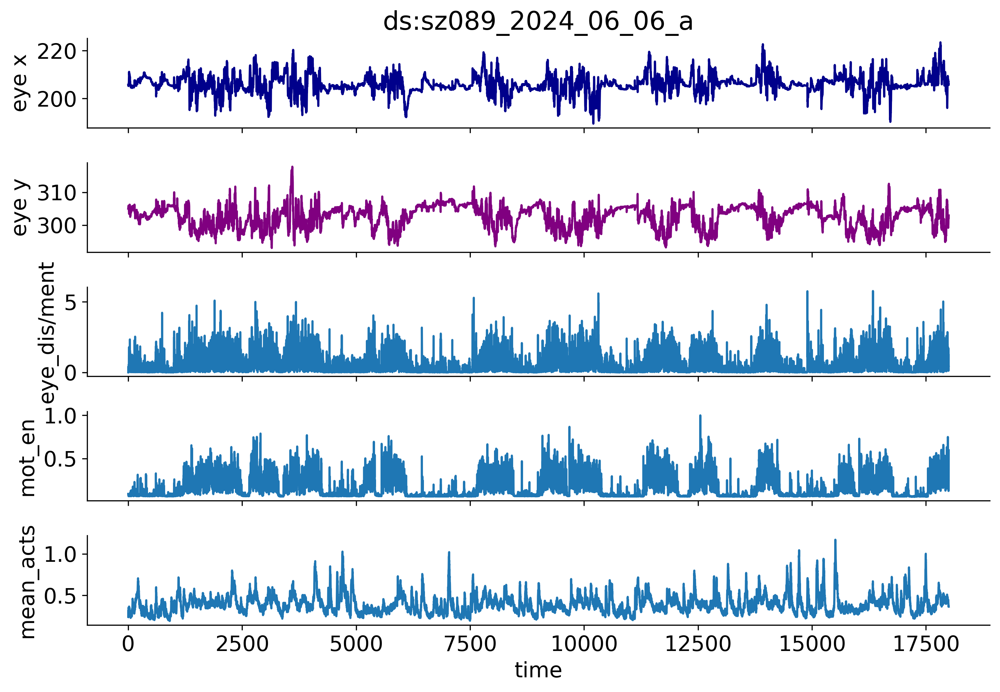

In [36]:
fig, axes = plt.subplots(5, 1, figsize=(10, 7), sharex=True, dpi=300)

axes[0].plot(eye_motion_x, color='darkblue')
axes[0].set_title(f'ds:{ds_ex}')
axes[0].set_ylabel('eye x')
sns.despine(ax=axes[0])

axes[1].plot(eye_motion_y, color='purple')
axes[1].set_ylabel('eye y')
sns.despine(ax=axes[1])

axes[2].plot(eye_displacement)
axes[2].set_ylabel('eye_dis/ment')
sns.despine(ax=axes[2])

axes[3].plot(mot_en)
axes[3].set_ylabel('mot_en')
sns.despine(ax=axes[3])

axes[4].plot(mean_activity)
axes[4].set_ylabel('mean_acts')
sns.despine(ax=axes[4])

plt.xlabel('time')
plt.tight_layout()
sns.despine()
plt.show()

Mean X movement: 0.442
Mean Y movement: 0.371
Eye moves more along X.


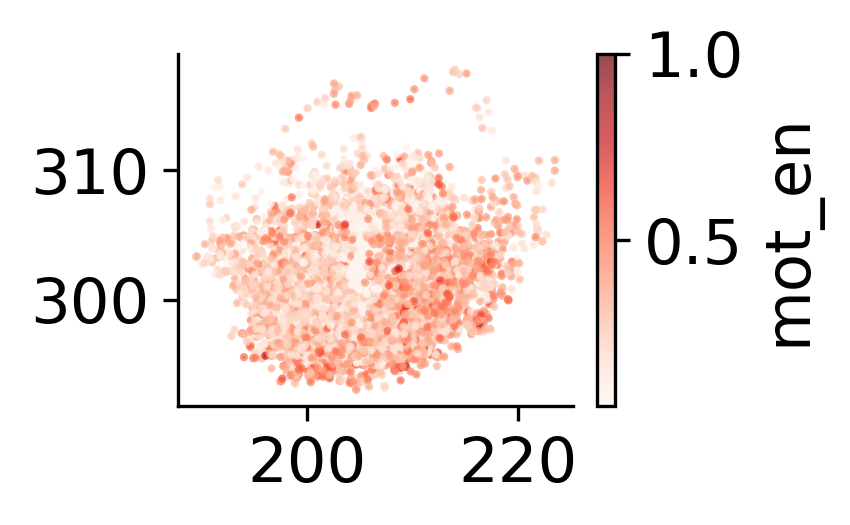

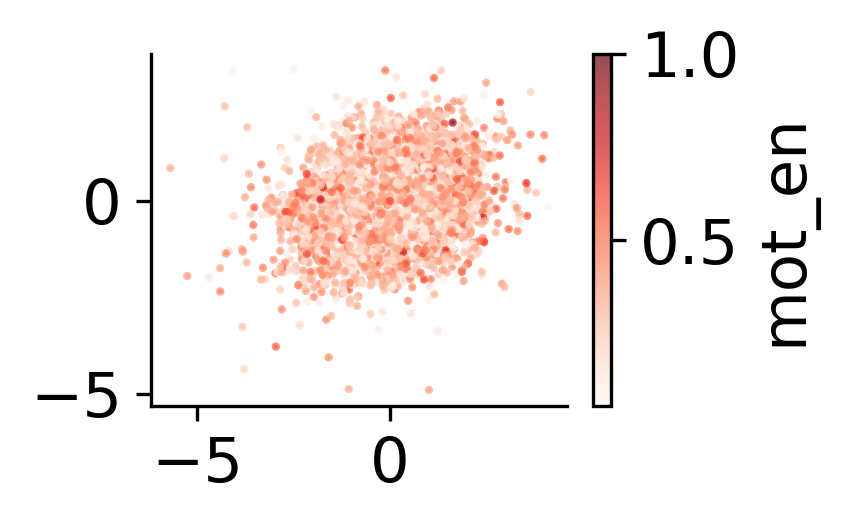

In [37]:
# Compare absolute motion
dx = np.diff(eye_motion_x)
dy = np.diff(eye_motion_y)
dx = np.append(dx,0)
dy = np.append(dy,0)

x_movement = np.mean(np.abs(dx))
y_movement = np.mean(np.abs(dy))
x_movement_sd = np.std(np.abs(dx))
y_movement_sd = np.std(np.abs(dy))

print(f"Mean X movement: {x_movement:.3f}")
print(f"Mean Y movement: {y_movement:.3f}")

if x_movement > y_movement:
    print("Eye moves more along X.")
    
else:
    print("Eye moves more along Y.")
    
# plot motion in x and y 
mot_en = np.array(mot_en)

plt.figure(figsize=(3,2), dpi=300)
sc = plt.scatter(eye_motion_x, eye_motion_y, c=mot_en, cmap='Reds', s=1, alpha=0.7)
plt.colorbar(sc, label='mot_en')
plt.show()

plt.figure(figsize=(3,2), dpi=300)
sc = plt.scatter(dx, dy, c=mot_en, s=1,cmap='Reds', alpha=0.7)
plt.colorbar(sc, label='mot_en')
plt.show()

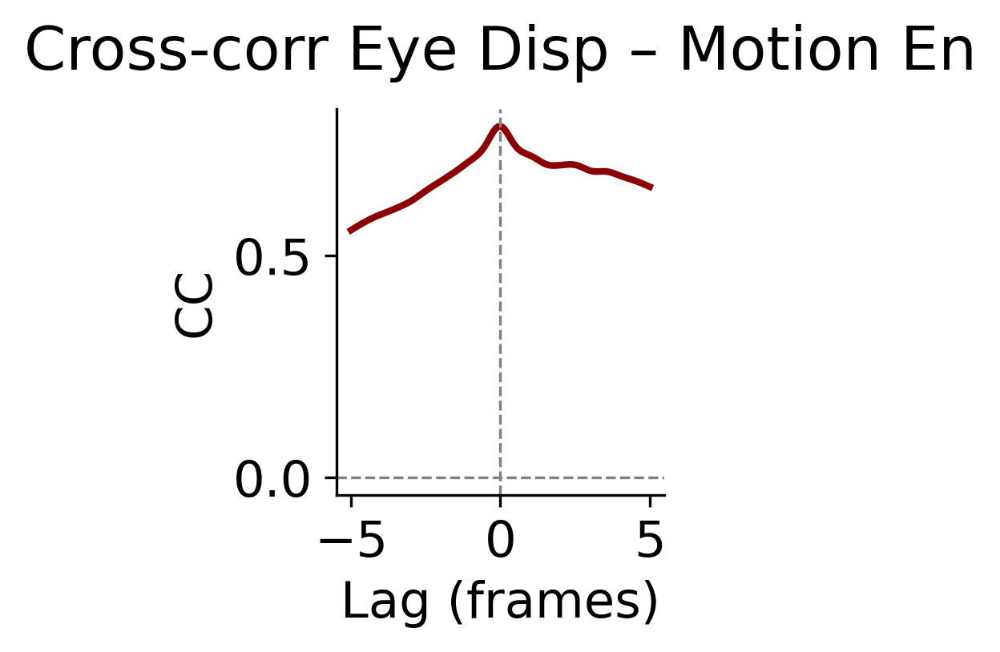

Pearson correlation: r = 0.791, p = 0.000e+00


In [38]:
sigma = 3  # smoothing sigma (frames)
disp_smooth = gaussian_filter1d(eye_displacement, sigma=sigma)
mot_en_smooth = gaussian_filter1d(mot_en, sigma=sigma)

# --- Demean signals ---
disp_demean = disp_smooth - np.mean(disp_smooth)
mot_demean = mot_en_smooth - np.mean(mot_en_smooth)

# normalised cross-correlation
corr = np.correlate(disp_demean, mot_demean, mode='full')
lags = np.arange(-len(disp_demean)+1, len(disp_demean)) # all length 
corr = corr / (np.std(disp_demean) * np.std(mot_demean) * len(disp_demean))

# --- restrict to ±lag_window frames ---
lag_window = int(framerate*5)  # ±5 seconds

mask = (lags >= -lag_window) & (lags <= lag_window)

# --- Plot ---
plt.figure(figsize=(2.5,3), dpi=300)
plt.plot(lags[mask]/framerate, corr[mask], color="darkred", linewidth=2)
plt.axhline(0, linestyle="--", linewidth=0.8, color='gray')
plt.axvline(0, linestyle="--", linewidth=0.8, color='gray')
plt.xlabel("Lag (frames)")
plt.ylabel("CC")
plt.title("Cross-corr Eye Disp – Motion En", y=1.05)
plt.tight_layout()
plt.show()

# --- Pearson correlation at zero lag ---
from scipy.stats import pearsonr
r, p = pearsonr(disp_smooth, mot_en_smooth)
print(f"Pearson correlation: r = {r:.3f}, p = {p:.3e}")

In [39]:
len(mot_en)

18000

# Compute and plot for all data
Load from dataframe and plot 1. motion energy and 2. eye motions in x and y and displacement 

In [40]:
# full_df['has_active']

In [49]:
# # Filter sessions where SLEAP == 1 ** careful needs local xls and drive xls to be up to date 

# # keep sessions for which we successfully loaded both motion energy and SLEAP output 
# df_sleap = full_df[(full_df['SLEAP'] == 1) & (full_df['motion_energy_original'].notna())] # we need the sessions that contain awakeness 

# # for those sessions, load eye variables (after ellipse fit), motion energy, framerate, sth else ?
# for idx, row in df_sleap.iterrows():
#     sess_name = row['ds']
    
#     # extract data
#     eye_x = np.array(row['eye_motion_x'])
#     eye_y = np.array(row['eye_motion_y'])
#     eye_disp = np.array(row['eye_displacement'])
#     mot_en = pad(np.array(row['motion_energy_original']))
#     framerate = row['framerate_orig']
    
#     # time_sec = np.arange(len(mot_en))/framerate
#     # mean_activity = np.array(row.get('data_mean_orig'))

#     #sns.color_palette("b", 5)
#     # Create subplots
#     fig, axes = plt.subplots(4, 1, figsize=(10, 7), sharex=True, dpi=300)
    
#     axes[0].plot(eye_x)
#     axes[0].set_ylabel('eye x')
#     sns.despine(ax=axes[0])
    
#     axes[1].plot(eye_y)
#     axes[1].set_ylabel('eye y')
#     sns.despine(ax=axes[1])
    
#     axes[2].plot(eye_disp)
#     axes[2].set_ylabel('eye disp.')
#     sns.despine(ax=axes[2])
    
#     axes[3].plot(mot_en)
#     axes[3].set_ylabel('mot en')
#     sns.despine(ax=axes[3])
    
#     # axes[4].plot(mean_activity)
#     # axes[4].set_ylabel('mean acts')
#     # sns.despine(ax=axes[4])
    
#     axes[3].set_xlabel('time')
    
#     plt.suptitle(f"Session: {sess_name}", y=1.02)
#     plt.tight_layout()
#     plt.show()

In [42]:
print(full_df.keys())

Index(['ds', 'active_motion_count', 'active_motion_durations',
       'mean_active_motion_duration', 'active_motion_intervals',
       'mean_active_motion_interval', 'active_mot_onsets',
       'active_mot_offsets', 'twitch_count', 'twitch_durations',
       ...
       'motion_en_pc2_coupling', 'pop_coupling_global_sorted',
       'pop_coupling_local_sorted', 'beh_coupling_sorted',
       'decoder_outputs_data_grid', 'logistic_decoder_outputs_data_grid',
       'eye_motion_x', 'eye_motion_y', 'eye_displacement',
       'motion_energy_original'],
      dtype='object', length=171)


In [43]:
from matplotlib.colors import ListedColormap

 Congrats! New shape is 18000


C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\4067253126.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[2].legend(frameon=False)
C:\Users\zaggila\AppData\Local\Temp\ipykernel_1220\4067253126.py:108: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[3].legend(frameon=False)


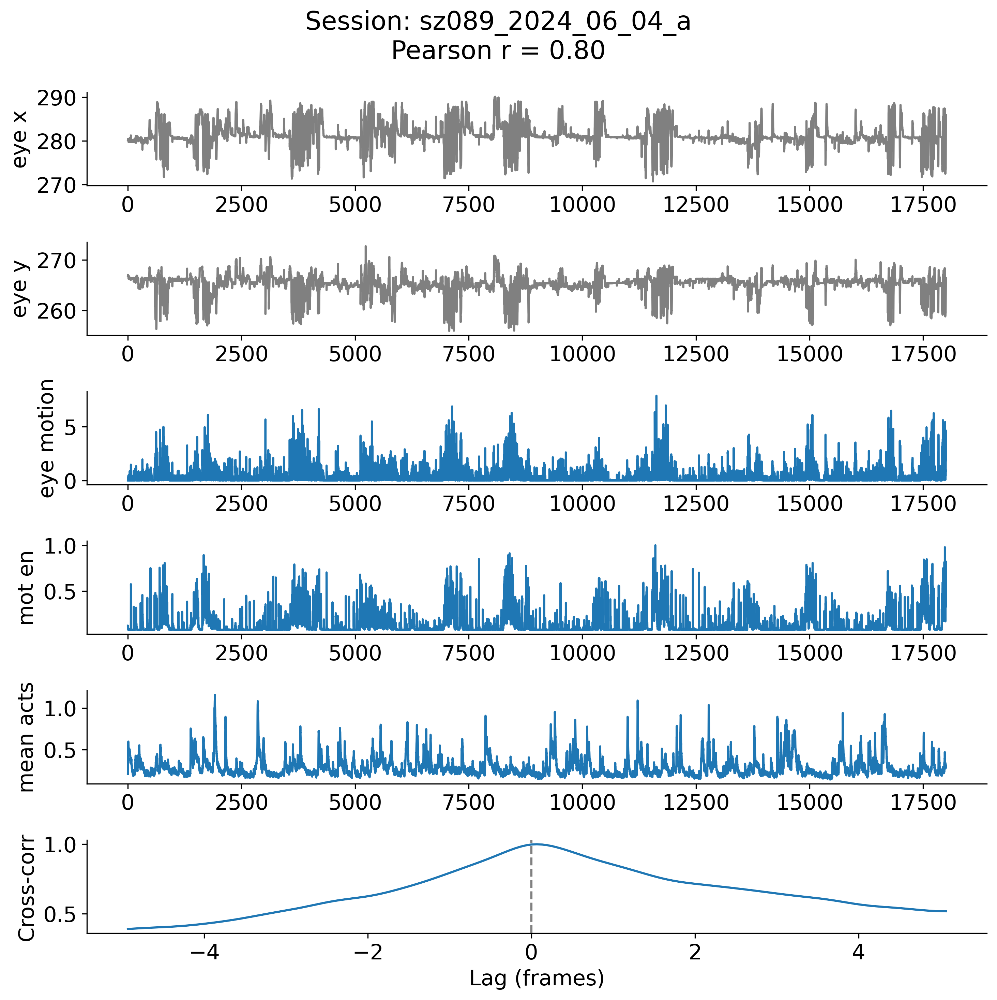

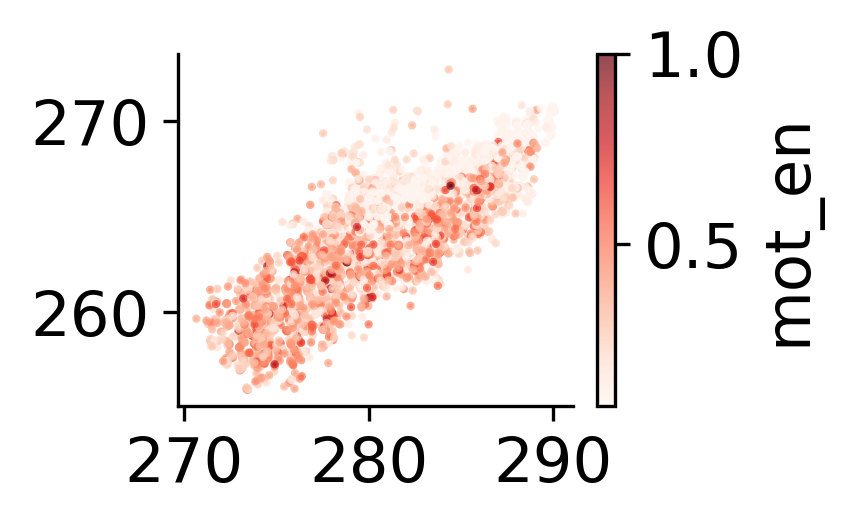

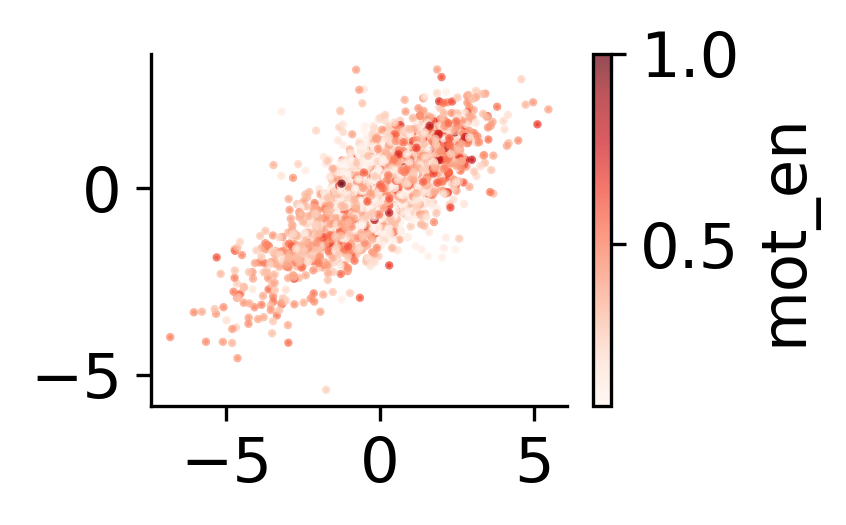

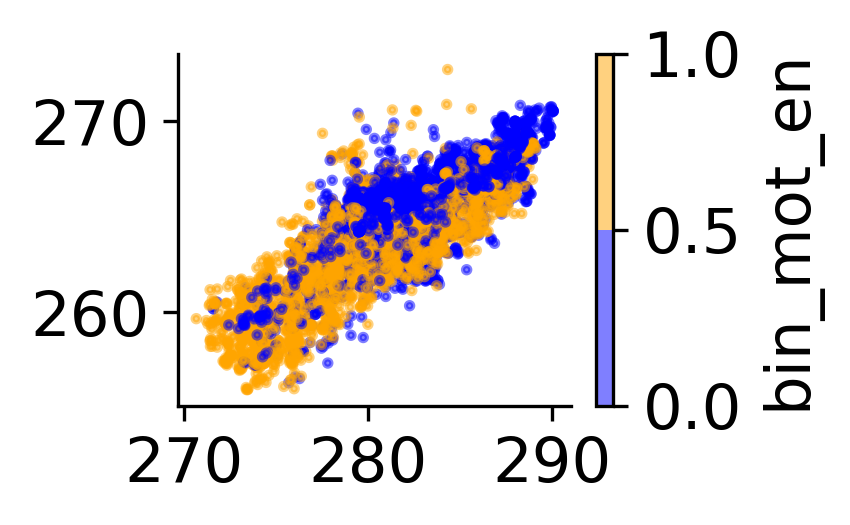

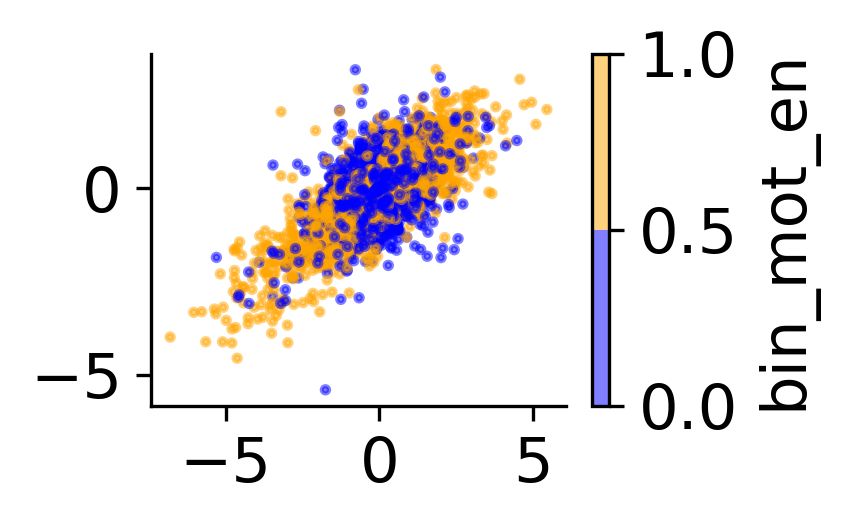

 Congrats! New shape is 18000


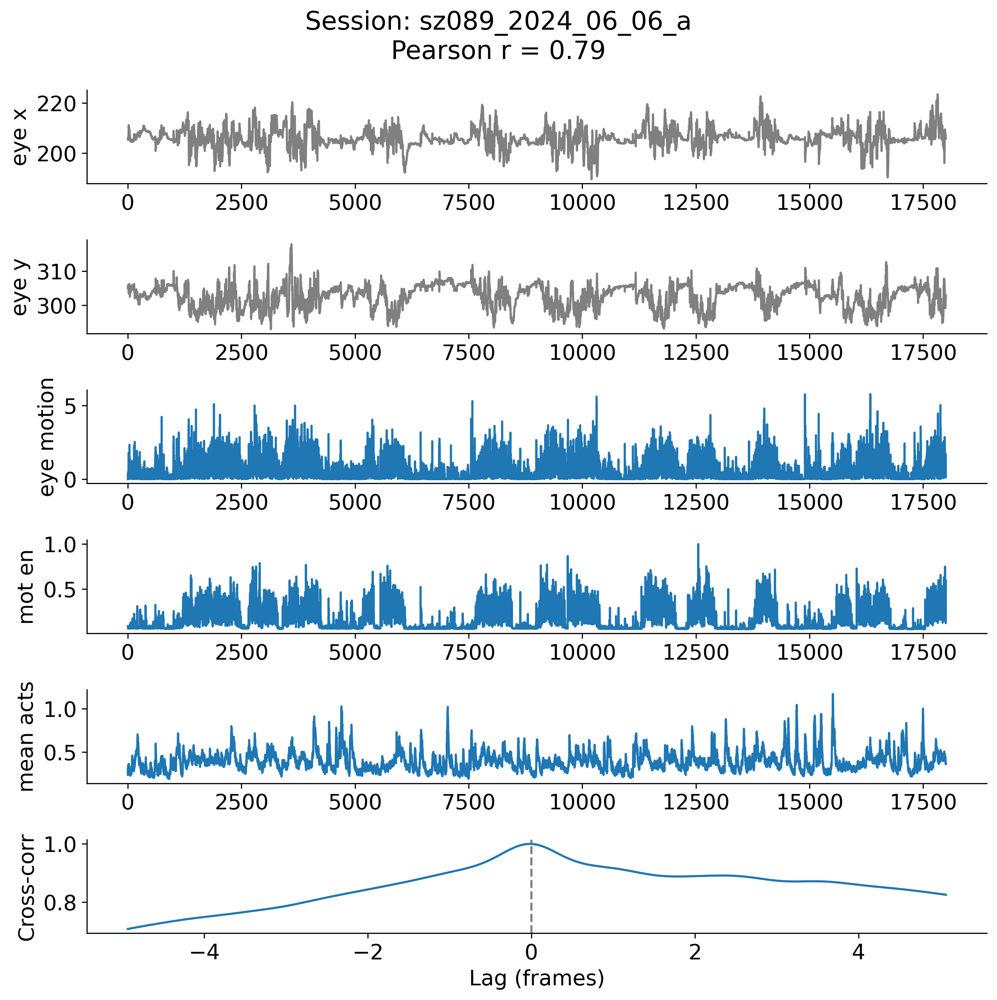

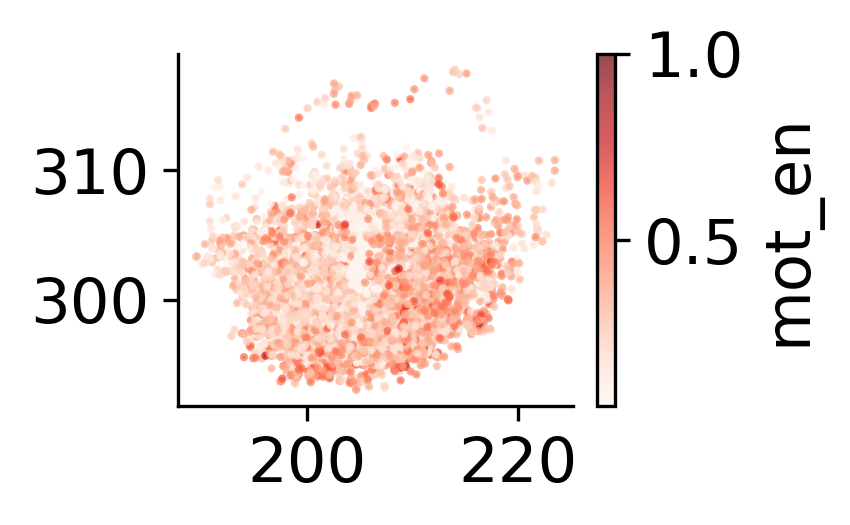

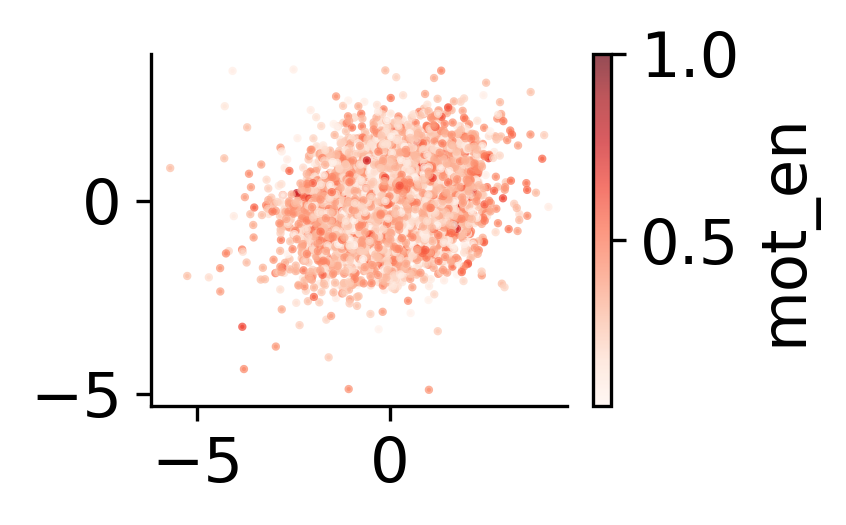

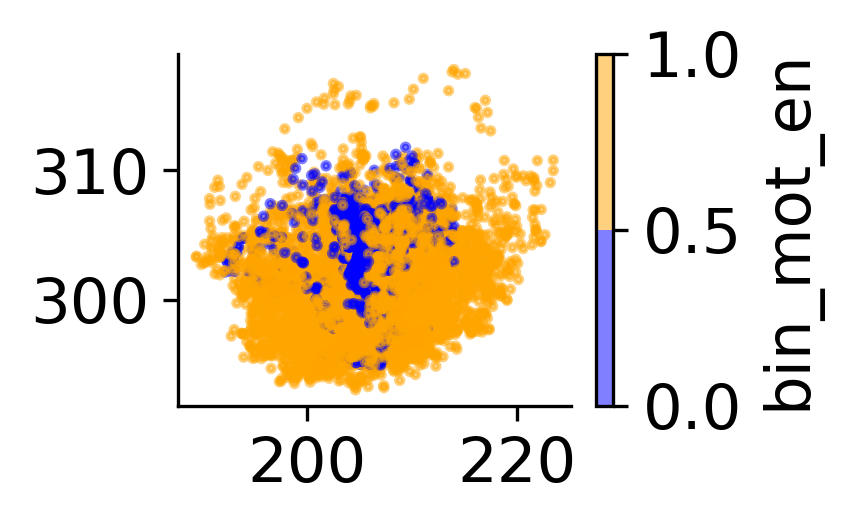

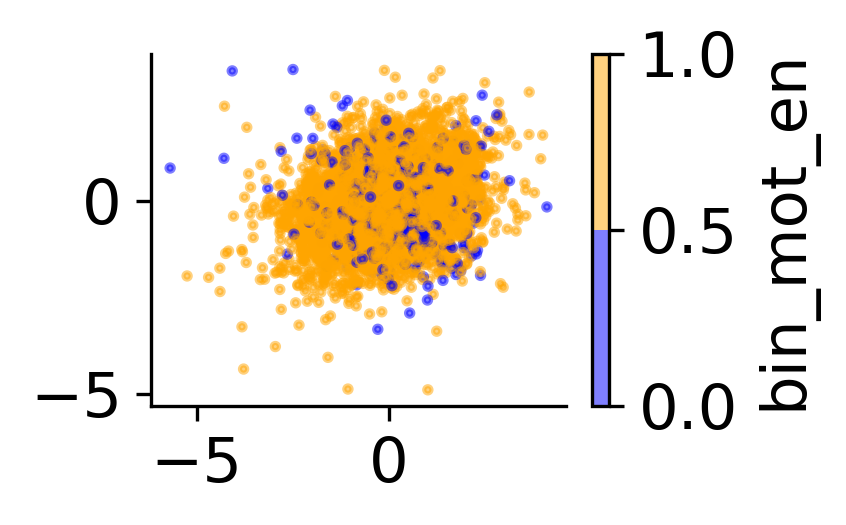

 Congrats! New shape is 18000


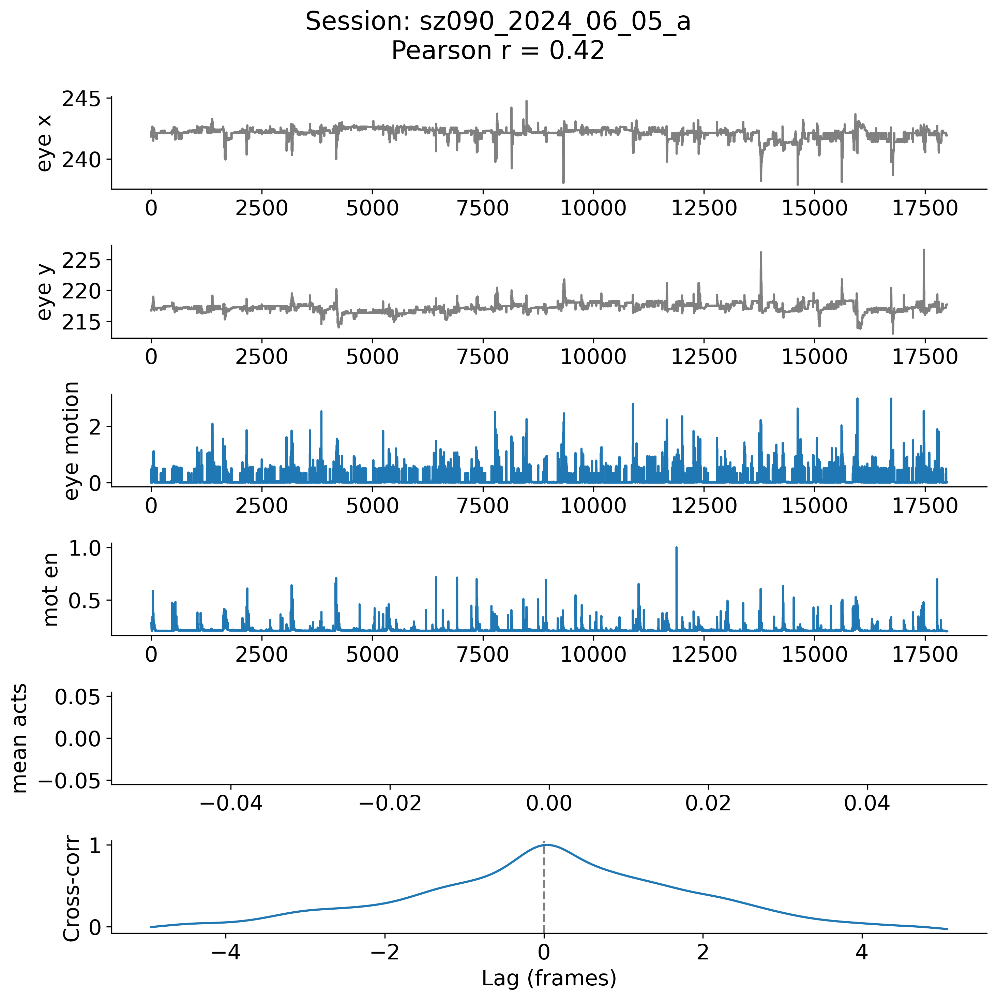

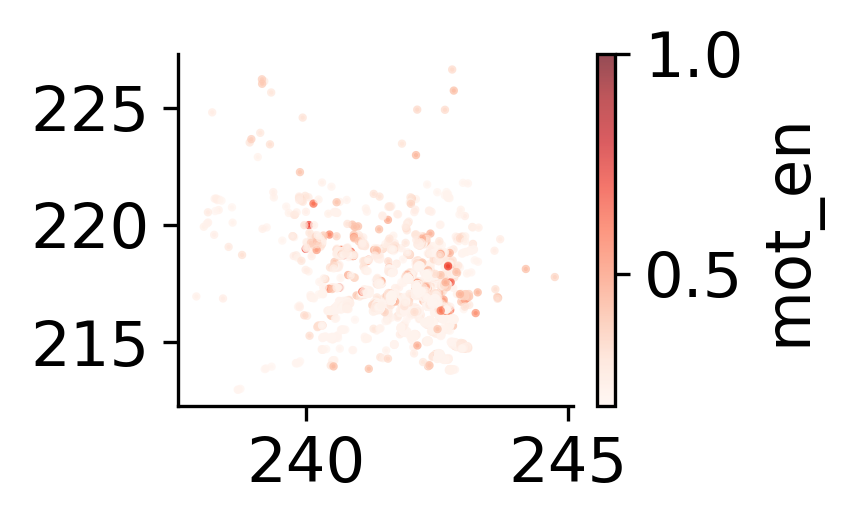

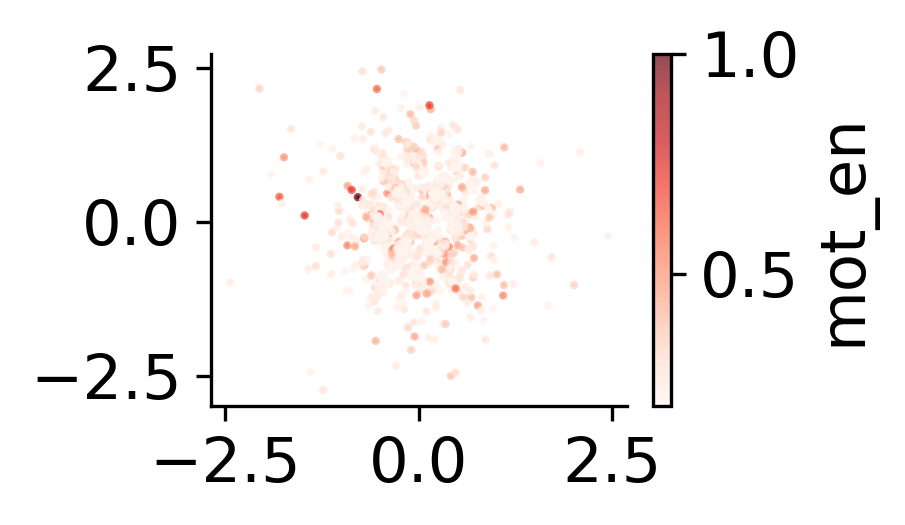

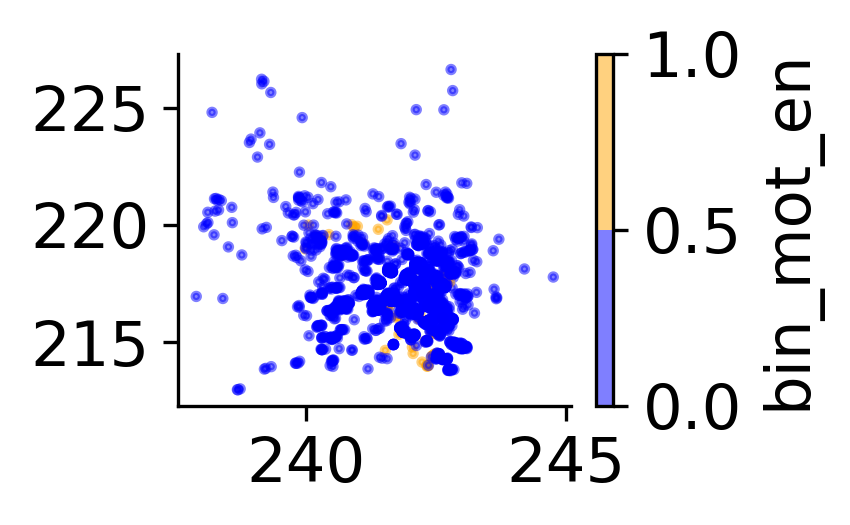

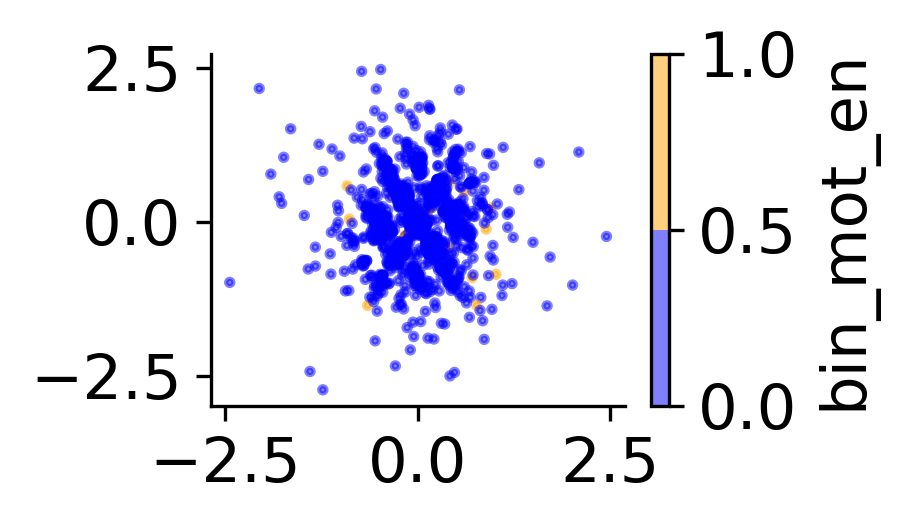

 Congrats! New shape is 18000


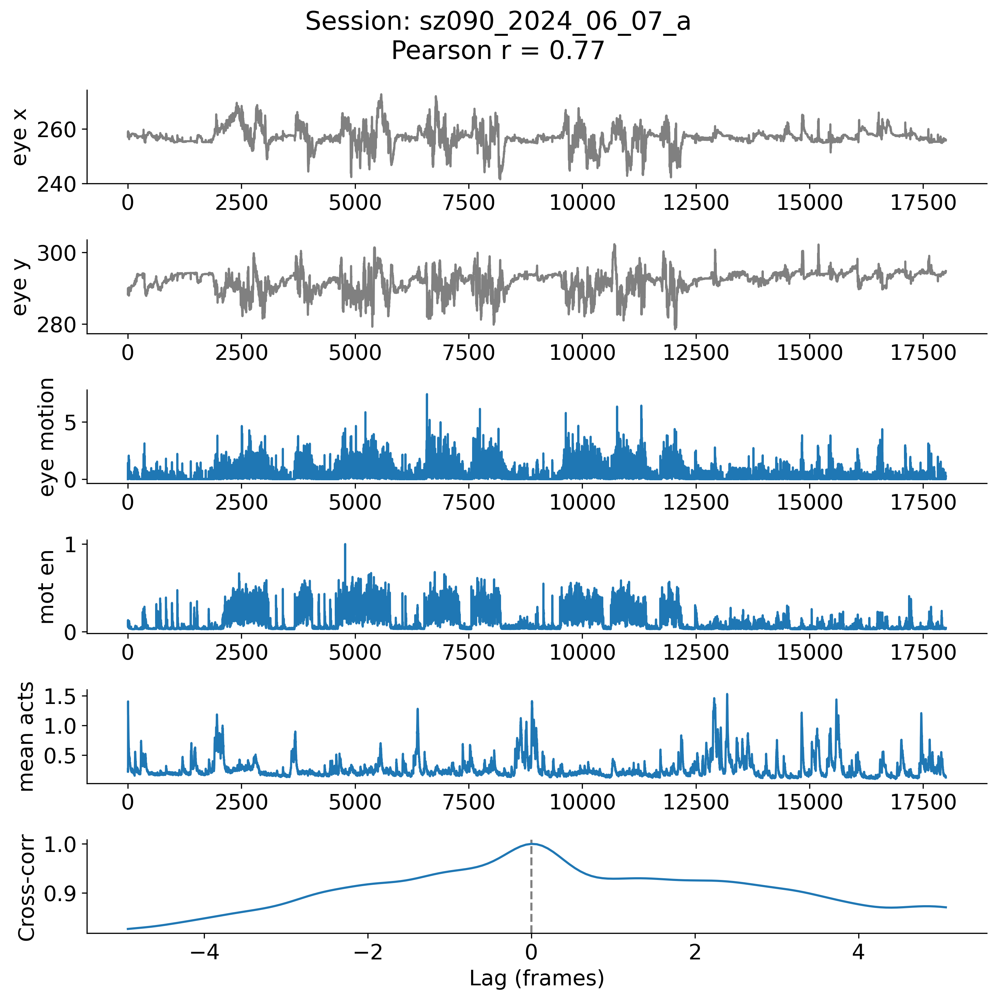

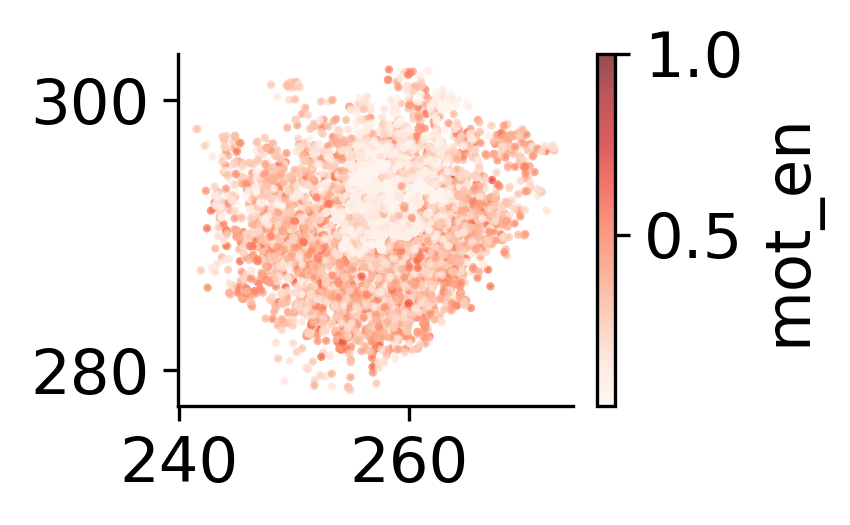

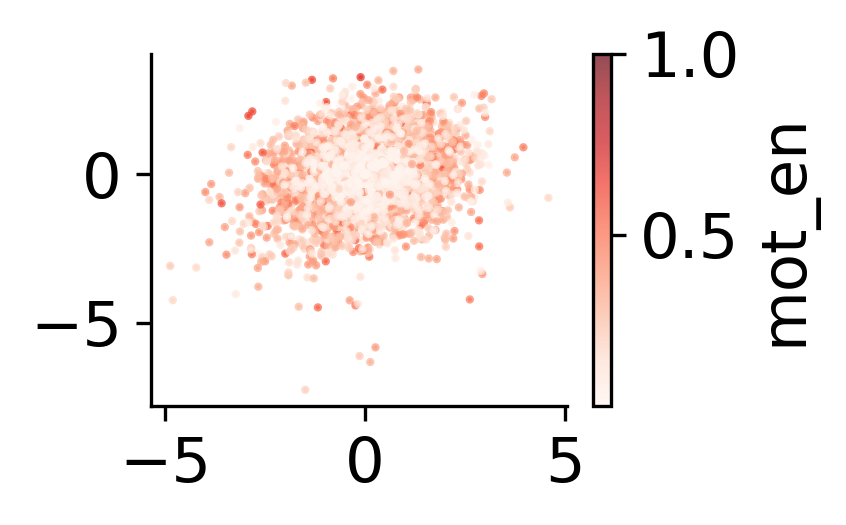

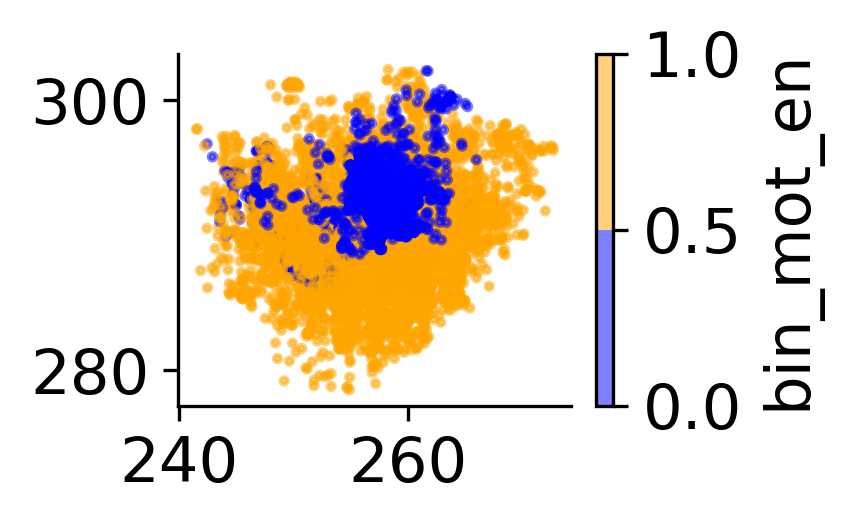

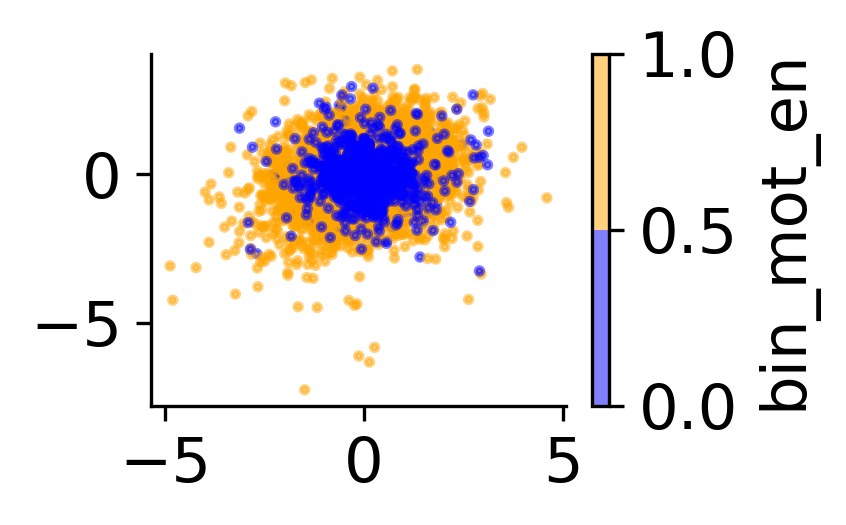

 Congrats! New shape is 18000


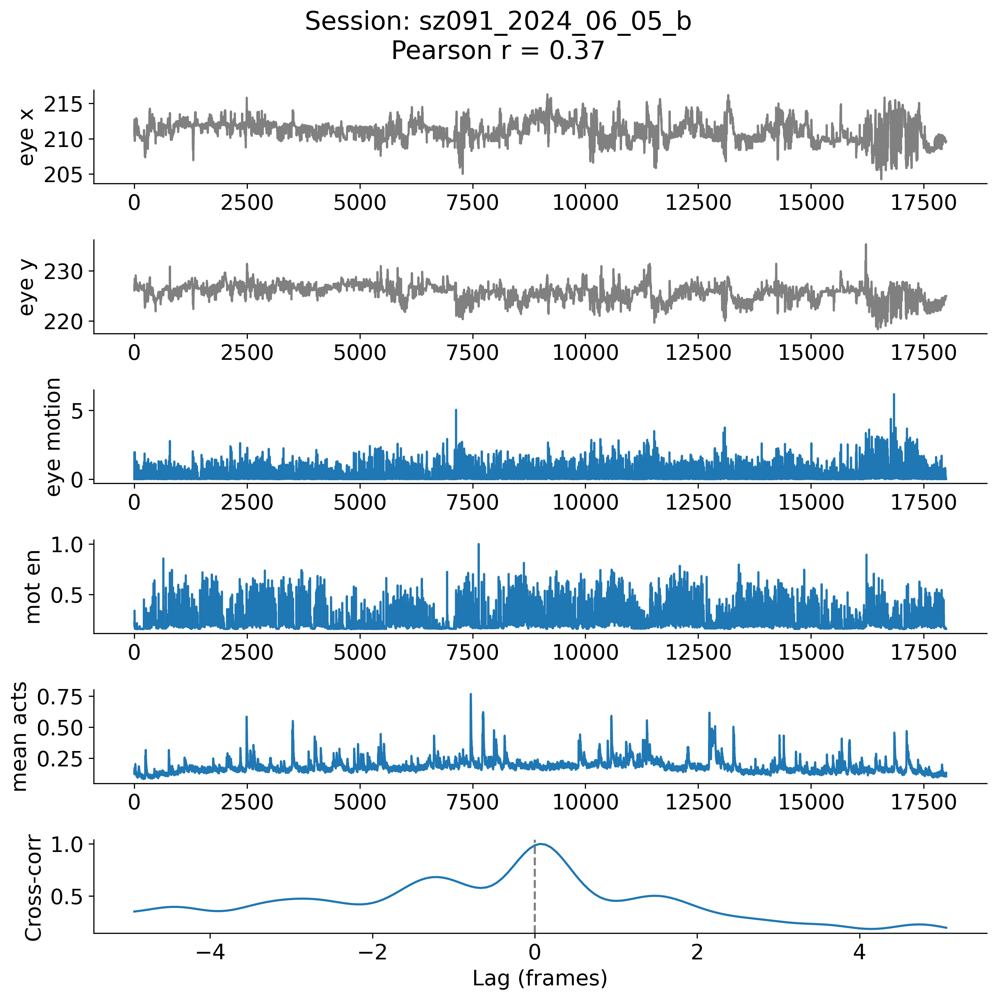

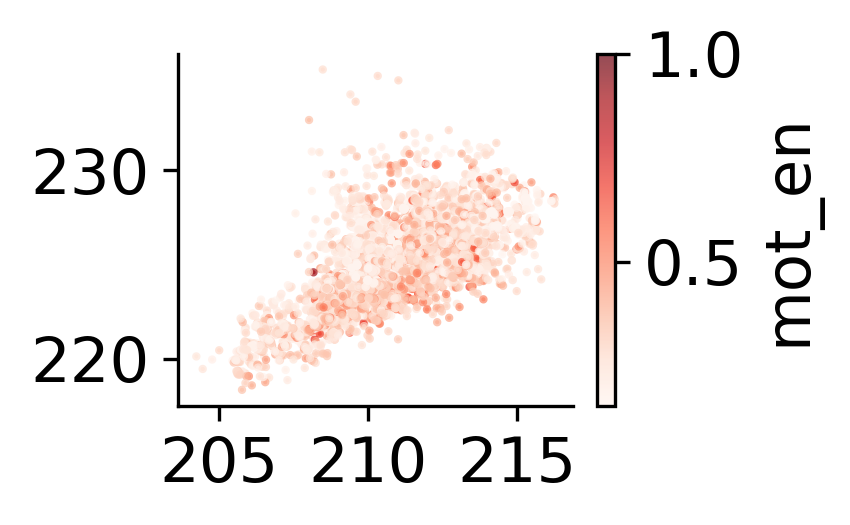

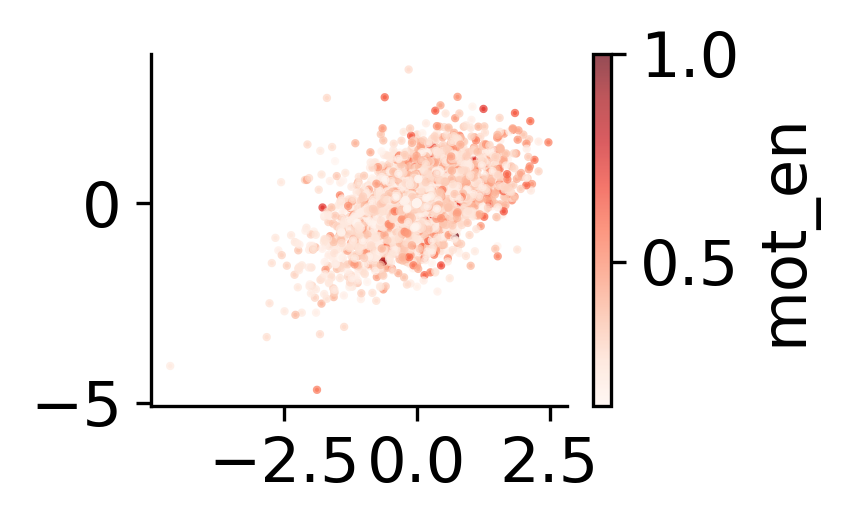

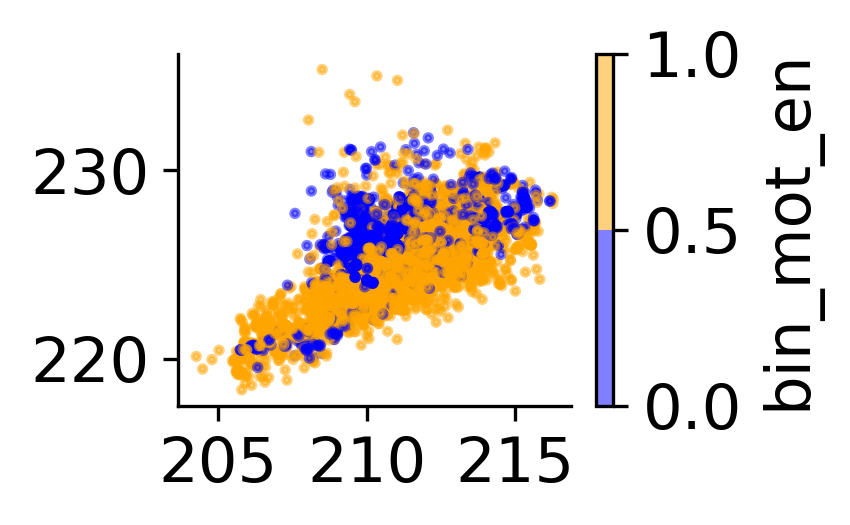

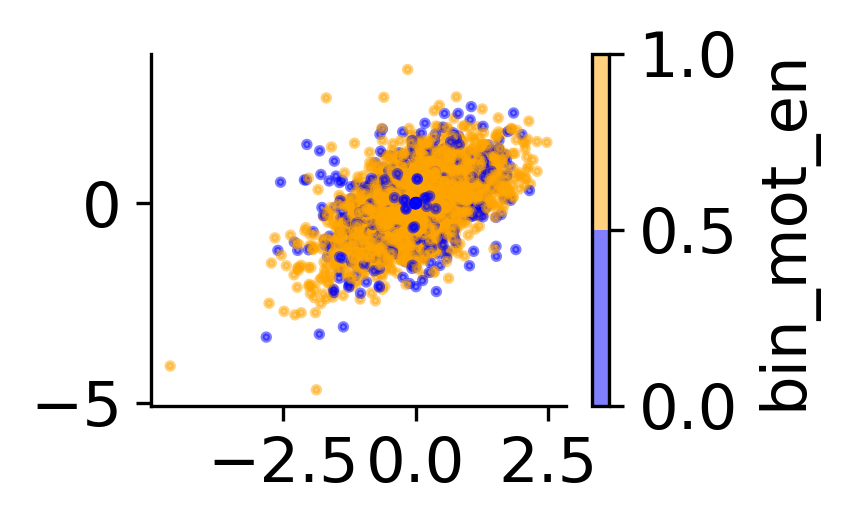

 Congrats! New shape is 18000


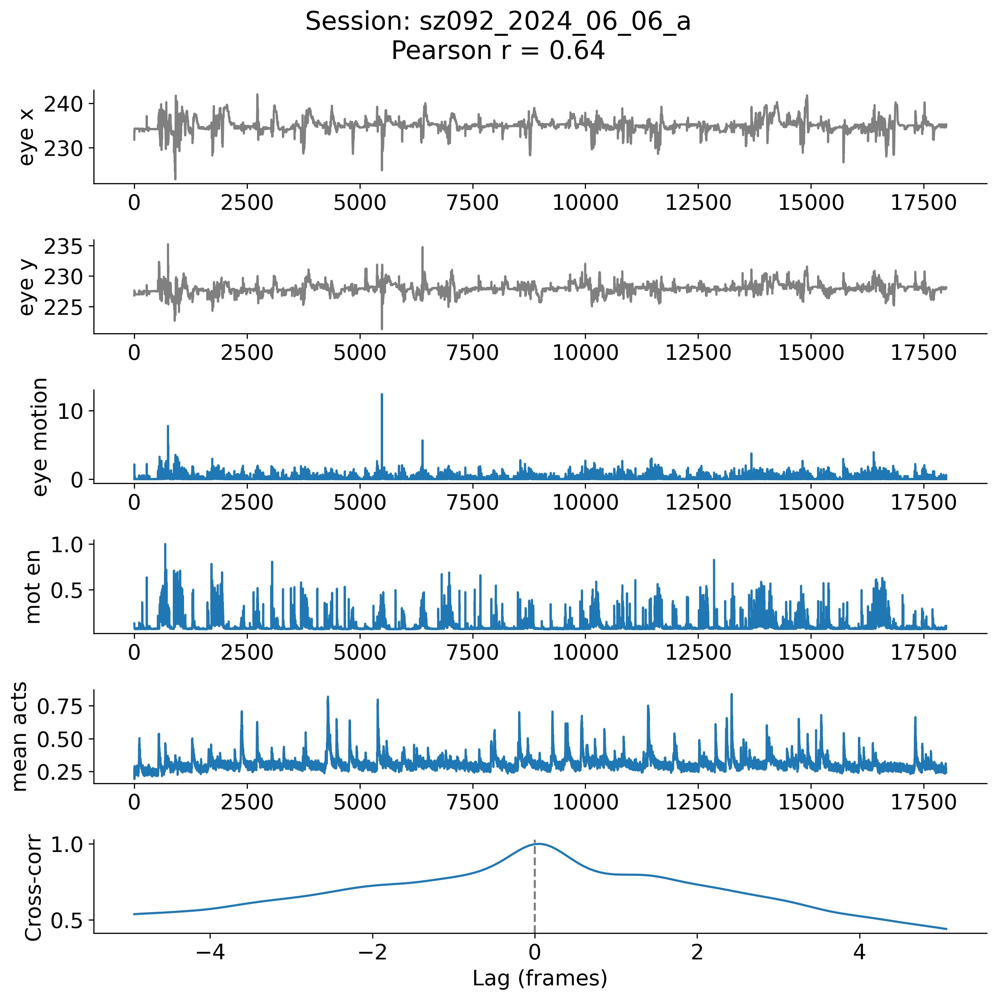

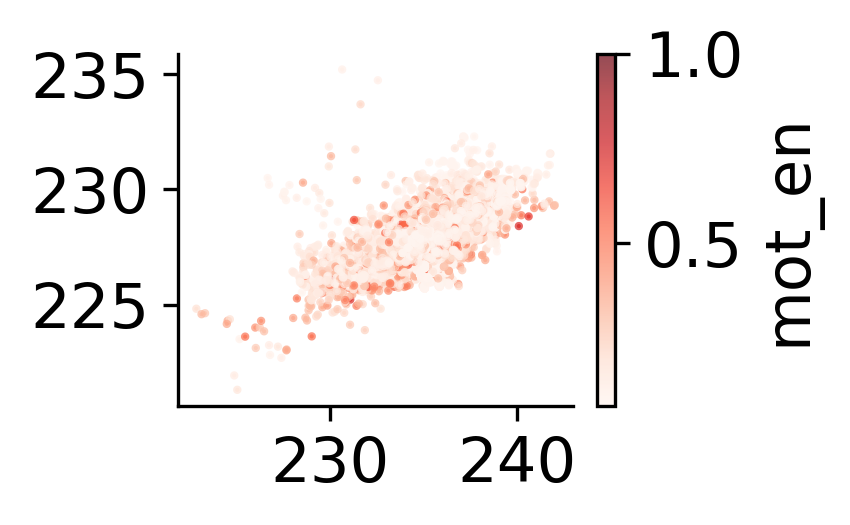

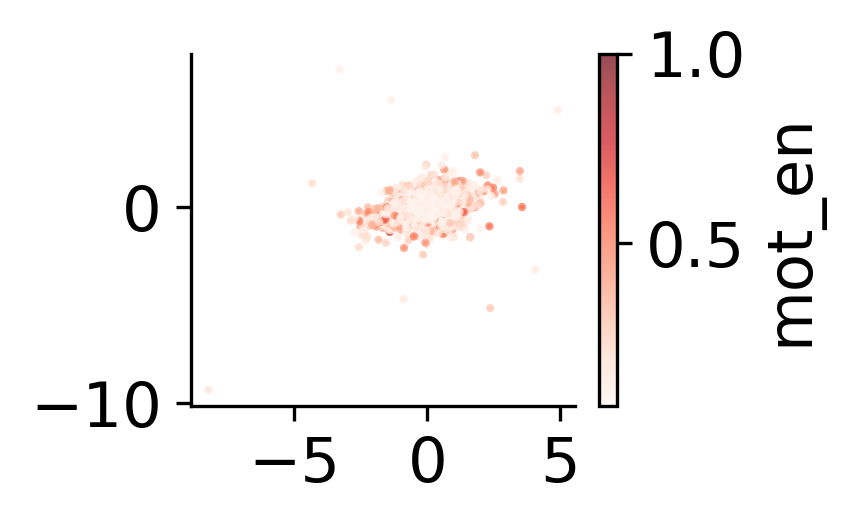

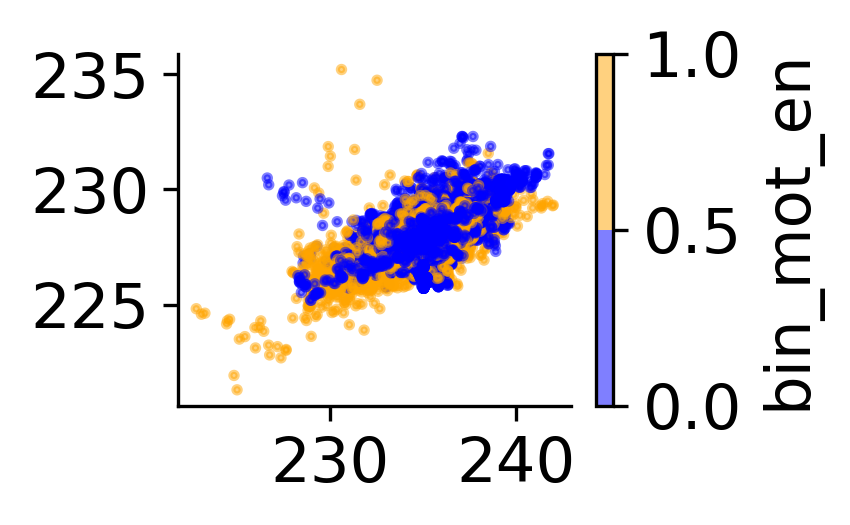

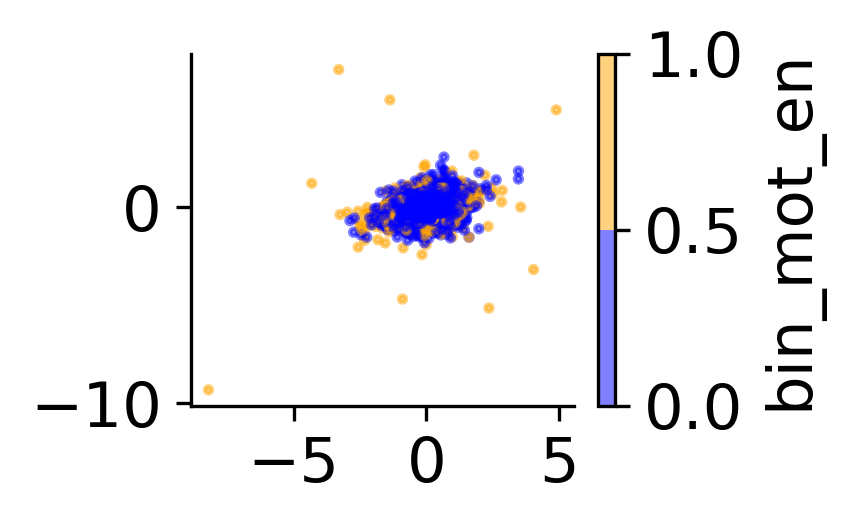

 Congrats! New shape is 18000


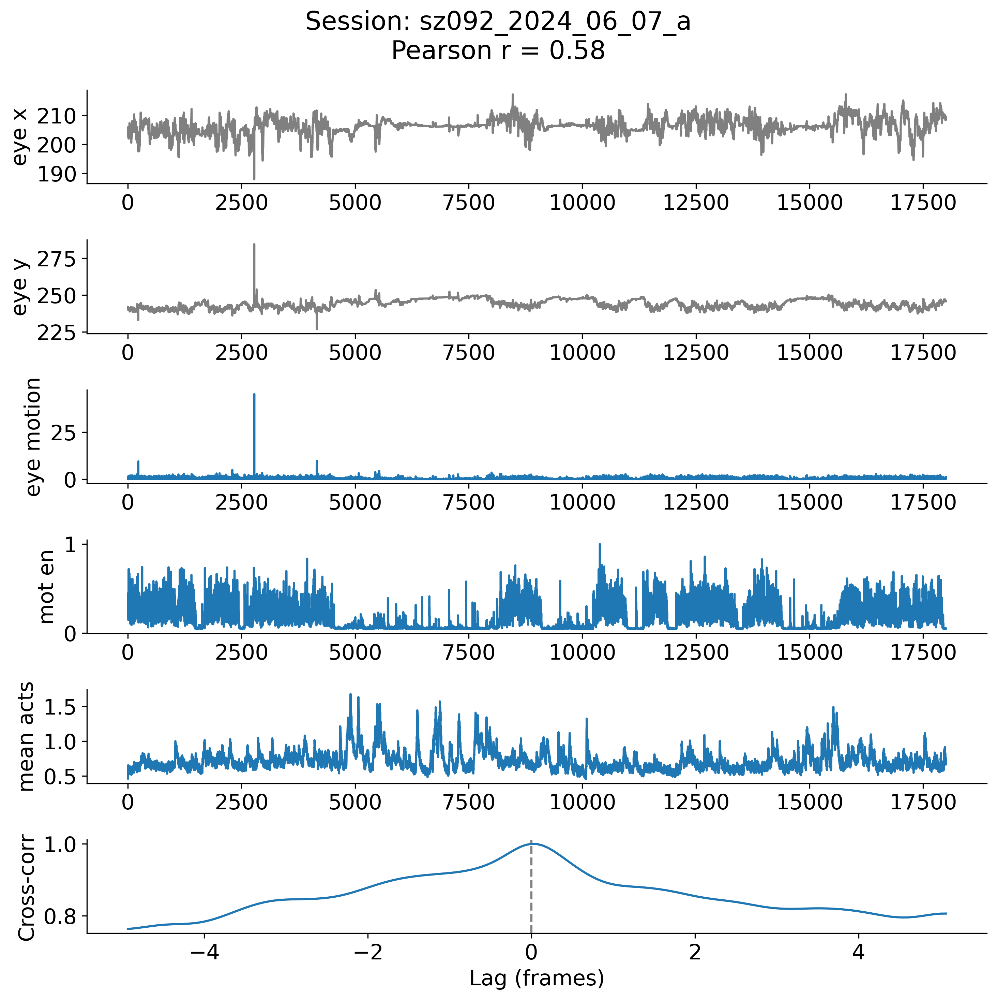

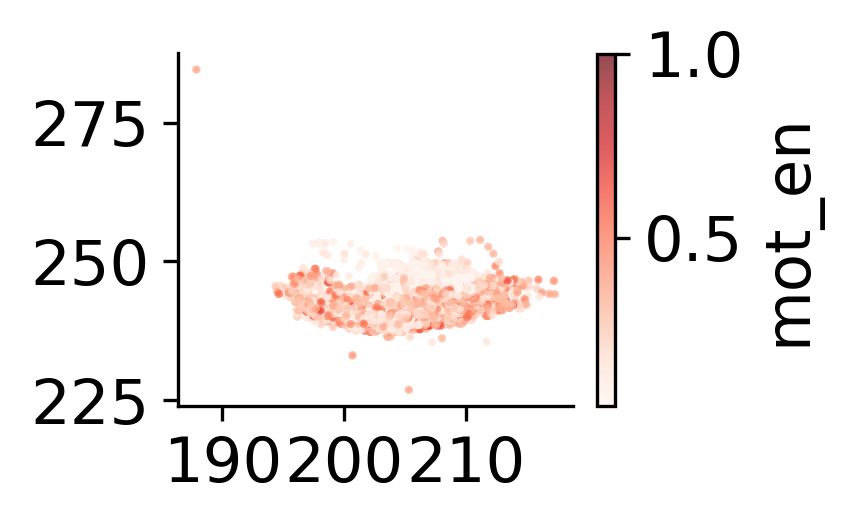

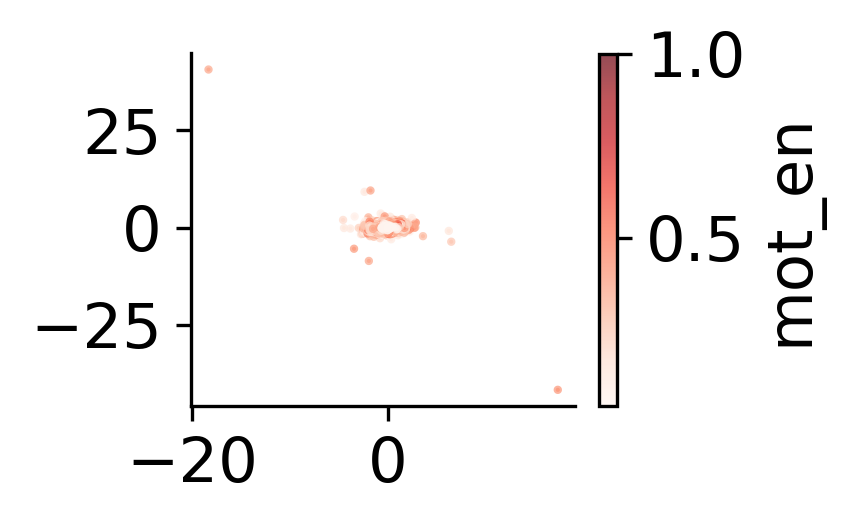

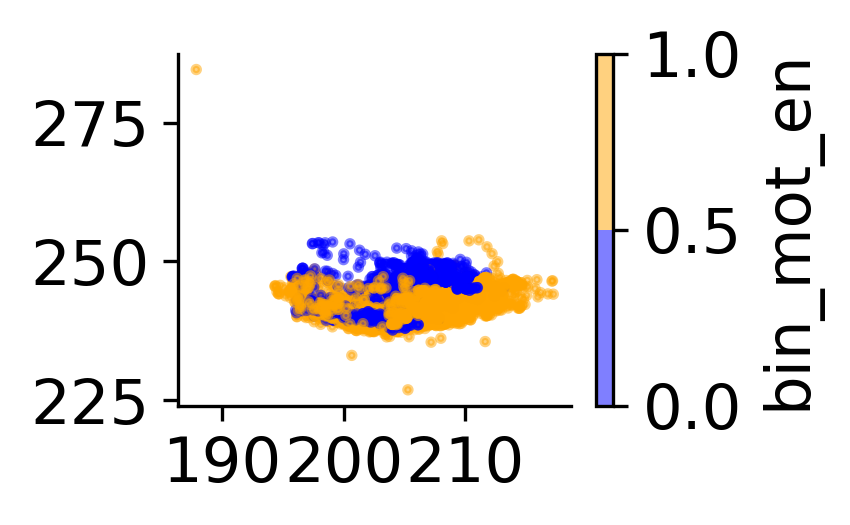

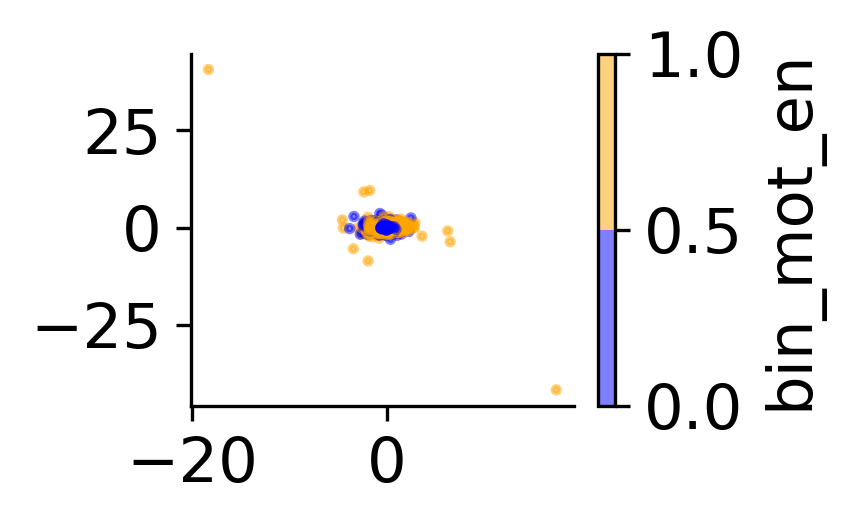

 Congrats! New shape is 27000


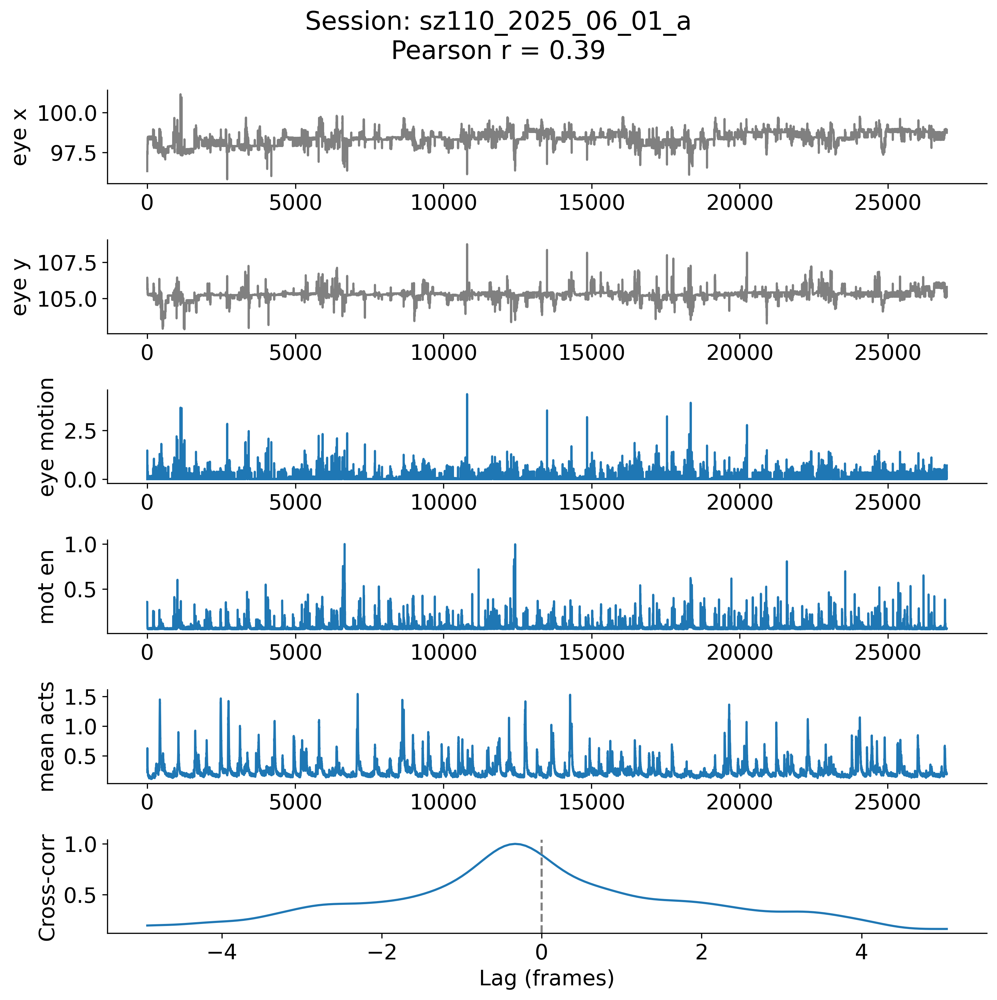

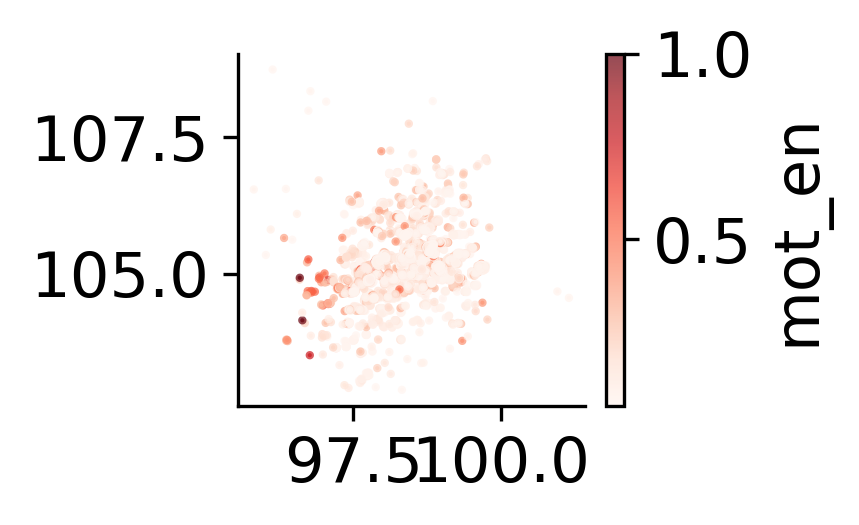

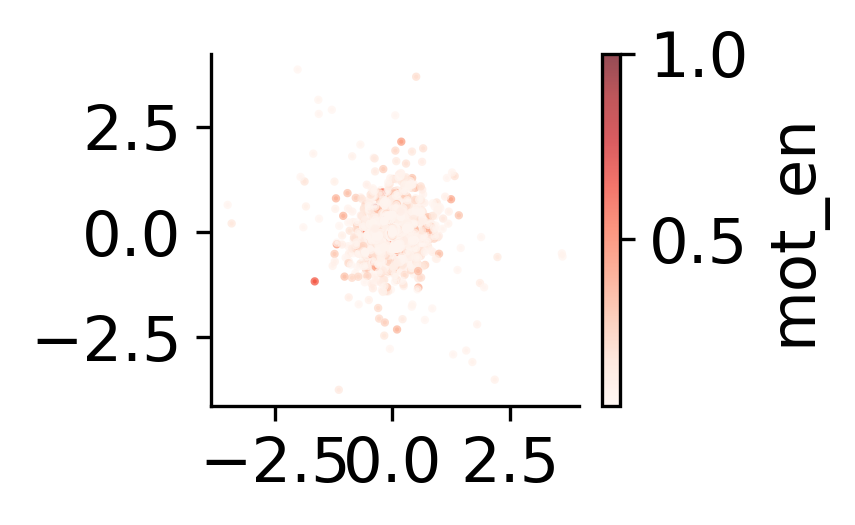

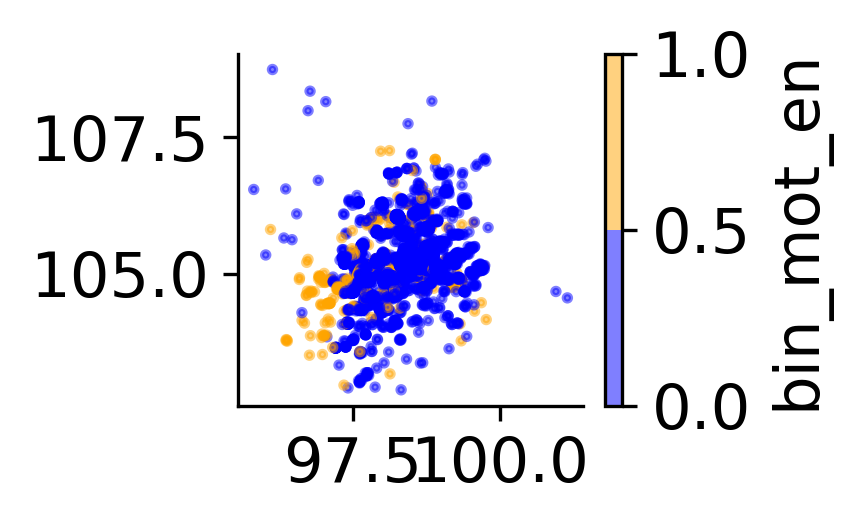

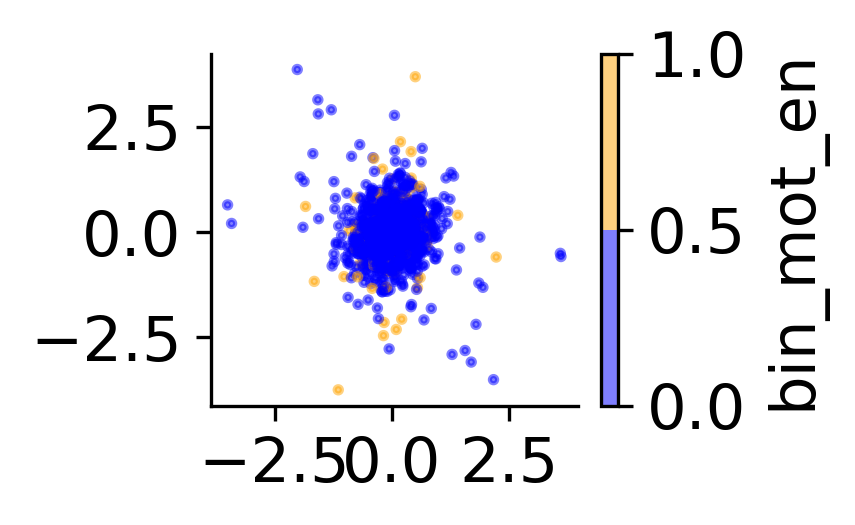

 Congrats! New shape is 27000


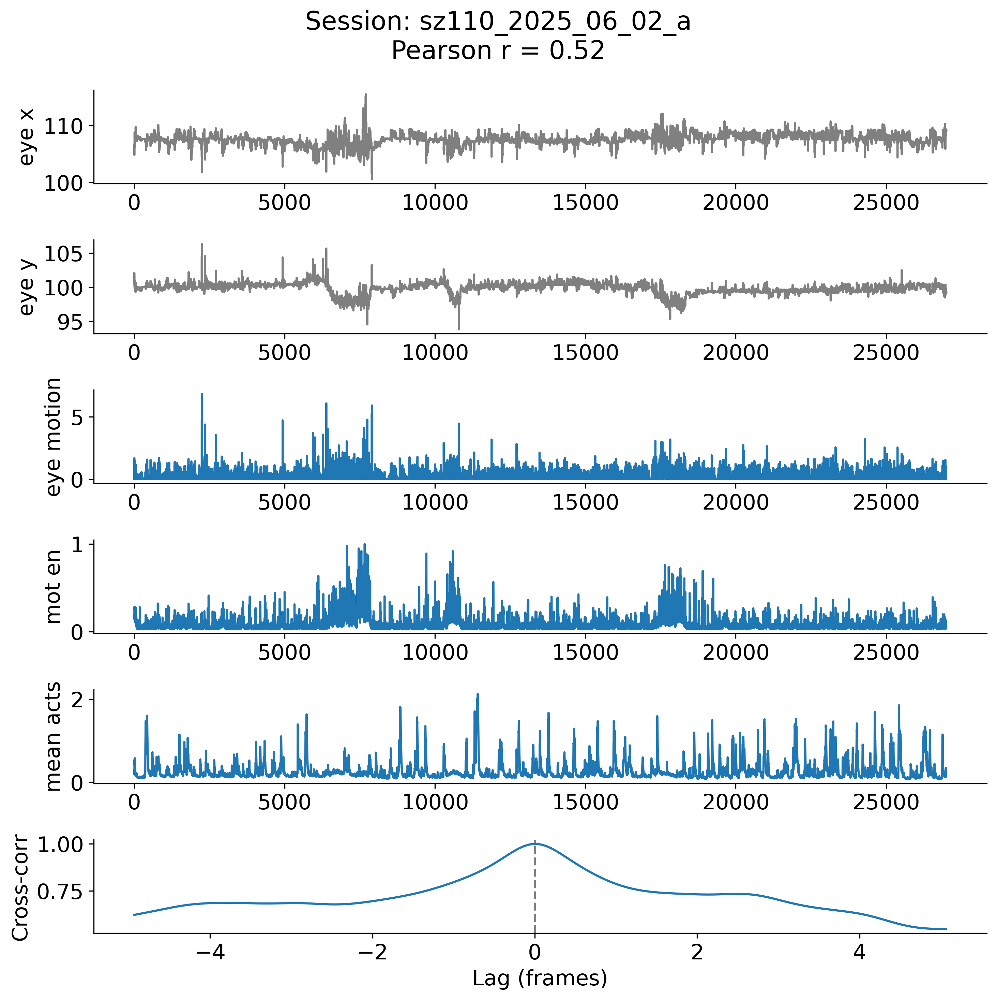

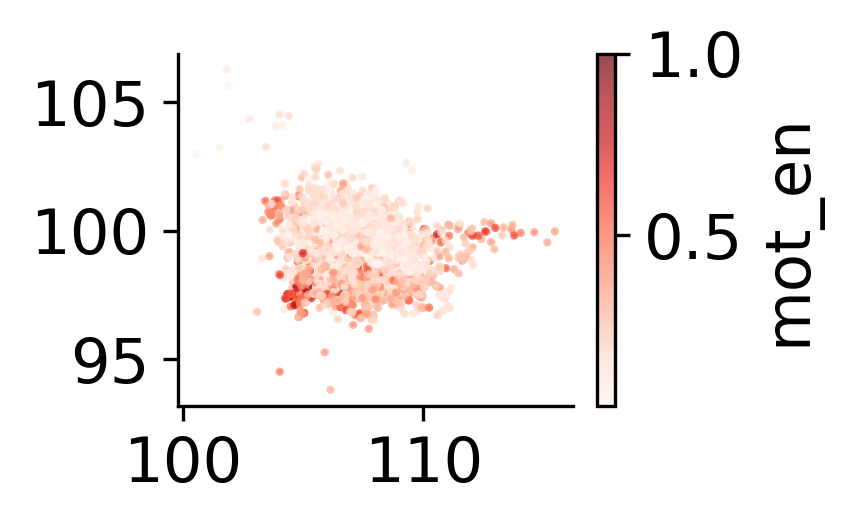

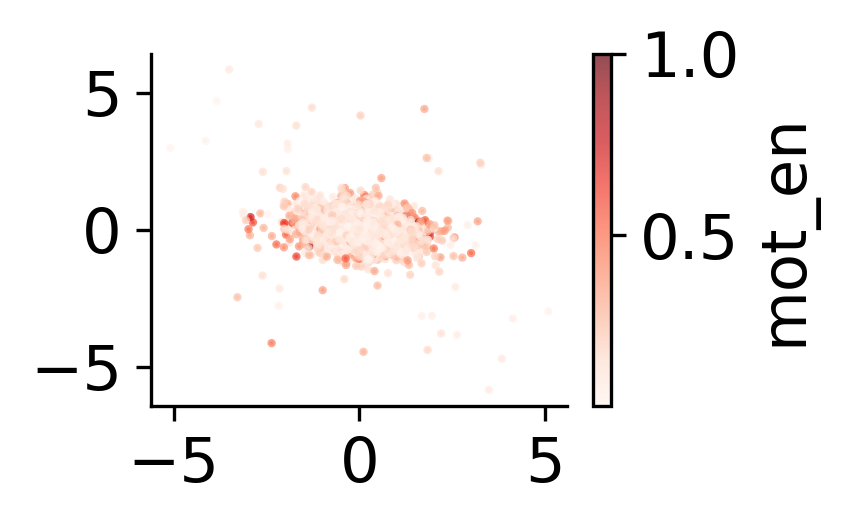

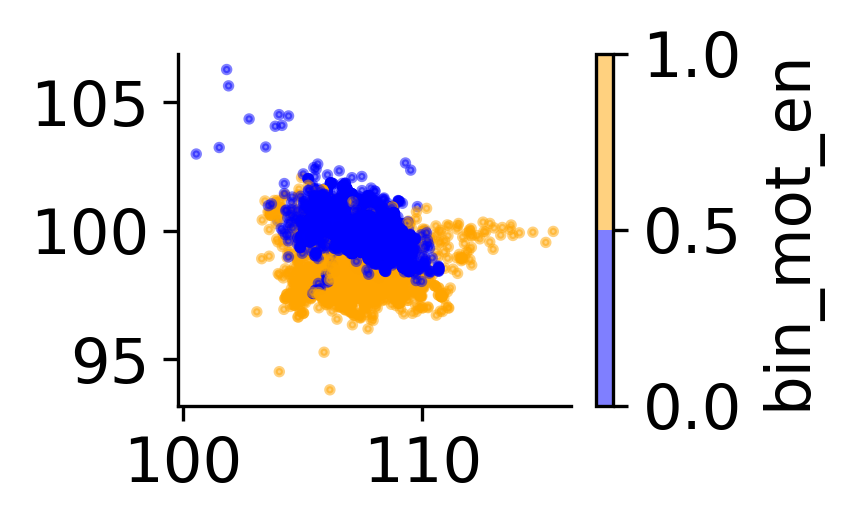

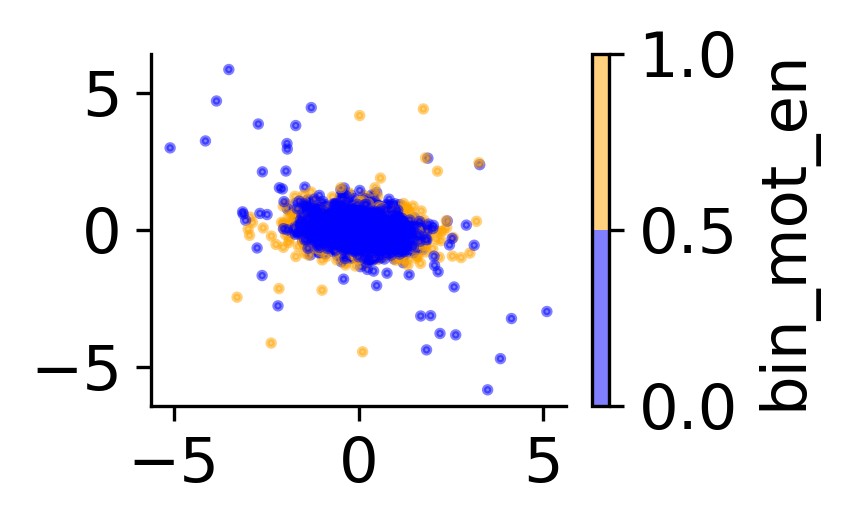

 Congrats! New shape is 18009


TypeError: len() of unsized object

In [52]:
from scipy.ndimage import gaussian_filter1d
from scipy.signal import correlate, find_peaks
from scipy.stats import pearsonr
from tqdm import tqdm

#Gaussian smoothing
smooth_sigma = 3 # for computing correlation 

# Filter sessions with SLEAP == 1 and motion energy also, ** careful needs local xls and drive xls to be up to date 
df_sleap = full_df[(full_df['SLEAP'] == 1) & (full_df['motion_energy_original'].notna())] # we need the sessions that contain awakeness 

# for those sessions, load eye variables (after ellipse fit), motion energy, framerate, sth else ?
for idx, row in df_sleap.iterrows():
    sess_name = row['ds']
    
    # Extract as numpy arrays
    eye_x = np.array(row['eye_motion_x'])
    eye_y = np.array(row['eye_motion_y'])
    eye_disp = np.array(row['eye_displacement'])
    mot_en = pad(np.array(row['motion_energy_original']))
    active_onsets = np.array(row['active_mot_onsets'])
    active_offsets = np.array(row['active_mot_offsets'])
    bin_mot_en = np.zeros_like(mot_en)

    for onset, offset in zip(active_onsets, active_offsets):
        bin_mot_en[onset:offset]= 1
        
    twitch_onsets = np.array(row['twitch_onsets_x']) # this _x is an issue from sleap loader - remove 
    twitch_offsets = np.array(row['twitch_offsets_x'])

    # in case of mismatch between mot en and eye motion 
    min_len = min(len(eye_disp), len(mot_en), len(eye_x), len(eye_y)) # cut to the shortest to align 
    eye_disp = eye_disp[:min_len]
    mot_en   = mot_en[:min_len]
    bin_mot_en = bin_mot_en[:min_len]
    eye_x = eye_x[:min_len]
    eye_y = eye_y[:min_len]
    
    mean_activity = np.array(row.get('data_mean_orig', np.zeros_like(mot_en)))
    framerate = row.get('framerate_orig')
    if framerate is None or np.isnan(framerate):
        framerate = 15 # fallback, here for eye all are imaged at 15 Hz
        
    # if exists then:
    if mot_en is not None:
        mot_en_smooth = gaussian_filter1d(mot_en, smooth_sigma)
    else:
        mot_en_smooth = None

    if eye_disp is not None:
        eye_disp_smooth = gaussian_filter1d(eye_disp, smooth_sigma)
    else:
       eye_disp_smooth = None

    # --- Compute correlations ---
    if mot_en is not None and eye_disp is not None:
        pear_corr, pear_p = pearsonr(eye_disp_smooth, mot_en_smooth)
    # spear_corr, spear_p = spearmanr(eye_disp_smooth, mot_en_smooth)

    # --- Cross-correlation ---
    corr = correlate(
        eye_disp_smooth - np.mean(eye_disp_smooth),
        mot_en_smooth - np.mean(mot_en_smooth),
        mode='full'
    )
    lags = np.arange(-len(mot_en)+1, len(mot_en))
    lags_sec = lags/framerate
    corr /= np.max(corr)  # normalize to [-1, 1]

    lag_window = int(framerate*5)  # e.g., ±3 seconds
    mask = (lags >= -lag_window+1) & (lags <= lag_window+1)

    # displacement in x or y 
    dx = np.diff(eye_x, prepend=eye_x[0])
    dy = np.diff(eye_y, prepend=eye_y[0])
    abs_dx = np.abs(dx)
    abs_dy = np.abs(dy)
    mean_dx = np.mean(abs_dx)
    mean_dy = np.mean(abs_dy)
    direction = "X" if mean_dx > mean_dy else "Y"

    # peak detection per state
    peaks_active, _ = find_peaks(eye_disp_smooth[bin_mot_en==1])
    peaks_rest, _ = find_peaks(eye_disp_smooth[bin_mot_en==0])
    freq_active = len(peaks_active) / (np.sum(bin_mot_en==1)/framerate/60) if np.sum(bin_mot_en==1)>0 else np.nan
    freq_rest = len(peaks_rest) / (np.sum(bin_mot_en==0)/framerate/60) if np.sum(bin_mot_en==0)>0 else np.nan
    
    # --- Plot ---
    fig, axes = plt.subplots(6, 1, figsize=(10, 10), sharex=False, dpi=300)

    axes[0].plot(eye_x, color='gray')
    axes[0].set_ylabel('eye x')
    sns.despine(ax=axes[0])

    axes[1].plot(eye_y, color='gray')
    axes[1].set_ylabel('eye y')
    sns.despine(ax=axes[1])

    axes[2].plot(eye_disp)
    # axes[2].plot(eye_disp_smooth, color='blue', label='smoothed')
    axes[2].set_ylabel('eye motion')
    axes[2].legend(frameon=False)
    sns.despine(ax=axes[2])

    axes[3].plot(mot_en)
    # axes[3].plot(mot_en_smooth, color='red', label='smoothed')
    axes[3].set_ylabel('mot en')
    axes[3].legend(frameon=False)
    sns.despine(ax=axes[3])

    axes[4].plot(mean_activity)
    axes[4].set_ylabel('mean acts')
    sns.despine(ax=axes[4])

    axes[5].plot(lags_sec[mask], corr[mask])
    axes[5].axvline(0, color='gray', linestyle='--')
    axes[5].set_xlabel('Lag (frames)')
    axes[5].set_ylabel('Cross-corr')
    sns.despine(ax=axes[5])

    plt.suptitle(
        f"Session: {sess_name}\nPearson r = {pear_corr:.2f}")
    plt.tight_layout()
    plt.show()

    # plot eye motion per direction per mouse 
    plt.figure(figsize=(3,2), dpi=300)
    sc = plt.scatter(eye_x, eye_y, s=1, c=mot_en,cmap='Reds', alpha=0.7)
    plt.colorbar(sc, label='mot_en')
    plt.show()
    
    plt.figure(figsize=(3,2), dpi=300)
    sc = plt.scatter(dx, dy, s=1, c=mot_en,cmap='Reds', alpha=0.7)
    plt.colorbar(sc, label='mot_en')
    plt.show()
    
    # bin motion energy
    
    cmap = ListedColormap(['blue', 'orange'])

    plt.figure(figsize=(3,2), dpi=300)
    sc = plt.scatter(eye_x, eye_y, s=3, c=bin_mot_en, cmap=cmap, alpha=0.5)
    plt.colorbar(sc, label='bin_mot_en')
    plt.show()
    
    plt.figure(figsize=(3,2), dpi=300)
    sc = plt.scatter(dx, dy, s=3, c=bin_mot_en, cmap=cmap, alpha=0.5)
    plt.colorbar(sc, label='bin_mot_en')
    plt.show()

In [ ]:
full_df['twitch_offsets_x']

In [ ]:
# Compute

# The Maxime Challenge no.2 2025 

***Old challenge: MouseCraft***:

- Can you plot how the above variables change as a function of age ? For example plot twitch_frequency, twitch_duration for each twitch per ds or mean_twitch_duration per ds (as violin plots or barplots or even scatterplots) ? Can you see any interesting differences, eg. % time in active - rest change or not ?
  
- Can you see any differences per genotype ? Eg compare twitch frequency or active-sleep % time in emx - vs gad pups along ages

- Can you think of other interesting metrices to compute ? For example, what about some simple plots on mousecraft performance, like ratio of accepted + edited / rejected twitches and same for active motions ? If ratio is big then accepted + edited > rejected, if else: rejected > accepted + edited


***New challenge: SLEAP (+ MouseCraft)***:

For each dataset plot:

1. A subplot containing the eye_motion_x and eye_motion_y, eye_diplacement (irrespective of direction) and the motion energy (original) in subplots 

Are high eye motion periods corresponding to active periods along P0-P5 ?

2. Compute correlation (pearson correlation coefficient) between eye displacement and motion energy. This is one value of similarity between the two and we can see how much they co-fluctuate.
3. Cross-correlation between eye displacement and motion energy (smooth first). Any lags ? 
4. Dx or Dy (displacement in y or x) is bigger?
5. Frequency of eye displacement (peak detection using peak detection function provided) per active or rest state
6. Scatter plot: eye displacement - motion energy (any eye specific twitches?) -> how else can we identify eye-twitches ?
7. Average eye motion after twitch motion onset (find each onset and each eye motion -3 - +3 sec around. Then plot the average eye motion in that window around an onset
8. average eye motion after awake motion onset